In [2]:
# ! pip install ftfy regex tqdm
# ! pip install git+https://github.com/openai/CLIP.git

In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import io

In [4]:
import torch
import clip
import gc
from PIL import Image
import os, pickle, time, re
from torchvision import datasets
from torchvision.transforms import transforms
import urllib.request

In [5]:
from urllib.error import HTTPError, URLError

## CLIP 유사한 이미지 추출

In [12]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load('ViT-B/32', device)
#cifar100 = CIFAR100(root=os.path.expanduser("~/.cache"), download=True, train=False)

In [13]:
titles = os.listdir('img_files/coat_prepro')

In [14]:
title_li = []
img_li = []
img_cat = []
input_text = 'a rainy day'
start = time.time()
num_range = 150
num = 0
print(num, input_text)
if num + num_range > len(titles): max_num = len(titles)
else: max_num = num+num_range

for title in titles[num:max_num]:
    title_li.append(title)
    img = Image.open(f"img_files/coat_prepro//{title}")
    img = img.resize((256, 256), Image.HAMMING)
    img_li.append(np.array(img))
    img = preprocess(img).unsqueeze(0).to(device)
    img_cat.append(img)

img_t = torch.cat(img_cat)
text_inputs = clip.tokenize([input_text]).to(device)
text_features = model.encode_text(text_inputs)
image_features = model.encode_image(img_t)
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = (100.0 * text_features @ image_features.T).softmax(dim=-1)
values, indices = similarity[0].topk(5)
print("time :", time.time() - start)

0 a rainy day
time : 10.833239555358887


## 유사도가  높은 5개의 이미지 시각화

20FW 반집업 기모 맨투맨 카키 731561520.jpg
003 a 로고 하프집업 맨투맨 그레이003 a LOGO QUARTER ZIP SWEAT gray.jpg
1960 pullover hoodie grey.jpg
1988 로고 후드 멜란지그레이.jpg
1960 pullover hoodie sage green.jpg


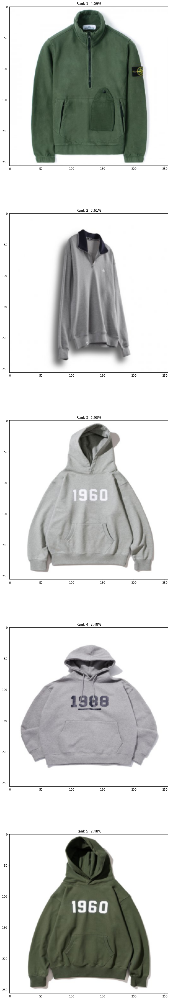

In [15]:
fig, axes = plt.subplots(5, 1, figsize=(10,10))
count = 0
for value, idx in zip(values, indices):
    print(title_li[idx])
    axes[count].imshow(img_li[idx])
    axes[count].set_title(f"Rank {count + 1}: {100 * value.item():.2f}%")
    count += 1
plt.subplots_adjust(top=5)
plt.show()

In [16]:
df = pd.DataFrame({'title': [title_li[index] for index in indices], 'similary': [round(value.item() * 100, 2) for value in values]})

if os.path.isfile(f'data_files/search_img_csv/{input_text}.csv') is False: df.to_csv(f'data_files/search_img_csv/{input_text}.csv') 
else:
    df_save = pd.read_csv(f'data_files/search_img_csv/{input_text}.csv', index_col='Unnamed: 0')
    df_save = df_save.append(df) 
    df_save = df_save.drop_duplicates()
    df_save = df_save.reset_index(drop=True)
    df_save.to_csv(f'data_files/search_img_csv/{input_text}.csv')

OSError: Cannot save file into a non-existent directory: 'data_files\search_img_csv'

In [14]:
print(f'{num} End')

0 End


## 한글 제목 영어로 번역하기

In [41]:
from googletrans import Translator

# Translator 클래스 객체 선언 (translator라는 변수명은 마음대로 정해주면 됨)
translator = Translator()

In [42]:
df = pd.read_csv('data_files/img_infos_csv/img_info_total.csv', index_col='Unnamed: 0')

In [43]:
df['태그'] = df['태그'].fillna('')

In [44]:
data_li = []
url = 'img_files/coat_prepro/'
for index in index_li[9153:]:
    title = df.iloc[index]['제목']
    print(index, title)
    tags = [tag.strip() for tag in df.iloc[index]['태그'].strip('[]').replace("'", '').split(',')]
    tags.insert(0, title)
    text = ','.join(tags).lower()
    
    product_num = df.iloc[index]['품번'].lower().strip()
    if product_num in text:
        text = text.replace(product_num, '')
    text = translator.translate(text).text
    
    text = re.sub('[^a-zA-Z, ]','',text).replace('Shipping', '').strip()
    
    data = {'title': title, 'image' :f"{url}{title}.jpg", 'caption': text}
    
    data_li.append(data)
    time.sleep(0.5)

In [45]:
df_coat_caption = pd.DataFrame(data_li)

In [46]:
df_coat_caption = pd.concat([df, df_coat_caption]).drop_duplicates('title').reset_index(drop=True)

KeyError: Index(['title'], dtype='object')

In [ ]:
# df_coat_caption.to_csv('data_files/coat_prepro_caption.csv')

In [37]:
df = pd.read_csv('data_files/caption_files/coat_prepro_caption.csv', index_col='Unnamed: 0')
df

,title,image,caption
0,시티보이 빅오버 옥스포드 반팔 셔츠_Sky Blue,img_files/origin_coat_img(prepro)/시티보이 빅오버 옥스포...,Boy Oxford Bigover City Short ShirtSKY BLUE Sl...
1,시티보이 빅오버 옥스포드 셔츠_Royal Blue,img_files/origin_coat_img(prepro)/시티보이 빅오버 옥스포...,"Boy Shirt Oxford ROYAL Look, Overfit, Bigover ..."
2,22ALL 2 TONE ARCH HOODIE GRAY,img_files/origin_coat_img(prepro)/22ALL 2 TONE...,"Gray, Fit Hoodie all tone Arch Rouge"
3,최현욱 착용22SS 2 TONE ARCH TEE WHITE,img_files/origin_coat_img(prepro)/최현욱 착용22SS 2...,"wook T Choi sleeved, graphics, Arch Tee shirt,..."
4,시티보이 빅오버 옥스포드 반팔 셔츠_White,img_files/origin_coat_img(prepro)/시티보이 빅오버 옥스포...,Boy Oxford sleeved city boy summer Bigover Cit...
...,...,...,...
11185,쿨에버 티셔츠블랙,img_files/origin_coat_img(prepro)/쿨에버 티셔츠블랙.jpg,"T Beat Coolmax, persimmon shirt sleeved sleeve..."
11186,WORLDWIDE AMES TSHIRTWH,img_files/origin_coat_img(prepro)/WORLDWIDE AM...,"Ames T sleeved Worldwide sleeved, short Overfi..."
11187,N215UPA910 유니 메이스 2PACK 쿨링 반팔 티셔츠 CARBON BLACK,img_files/origin_coat_img(prepro)/N215UPA910 유...,"T National Ss Pal sleeved sleeved, pACK Short ..."
11188,LIFE IS TEEPUNK ROCK TEECHARCOAL,img_files/origin_coat_img(prepro)/LIFE IS TEEP...,"TEECHARCOAL, logo overfit sleeved, summer LIFE..."


In [38]:
for i in df[['title', 'caption']].values:
    print(i)

['시티보이 빅오버 옥스포드 반팔 셔츠_Sky Blue'
 'Boy Oxford Bigover City Short ShirtSKY BLUE Sleeve']
['시티보이 빅오버 옥스포드 셔츠_Royal Blue'
 'Boy Shirt Oxford ROYAL Look, Overfit, Bigover City Overfit BLUE,']
['22ALL 2 TONE ARCH HOODIE GRAY' 'Gray, Fit Hoodie all tone Arch Rouge']
['최현욱 착용22SS 2 TONE ARCH TEE WHITE'
 'wook T Choi sleeved, graphics, Arch Tee shirt, Wearing Overfit Hyun short ivy TONE logo, league, SS White, Graphic']
['시티보이 빅오버 옥스포드 반팔 셔츠_White'
 'Boy Oxford sleeved city boy summer Bigover City short shirtwhite, overfit, shirt, half']
['67 배송 22SS 오버핏 피케티셔츠 블랙'
 'T shirt sleeved SS Picket Black, PK Overfit short Karati shirt,']
['부클 카라 반팔 니트  5 COLORBOUCLE COLLAR HALF SLEEVE KNIT  5 COLOR'
 'knit, Kara Color, Karati, sleeved sleeved, Bookle knit summer kara short Short Half Sleeve colorboucle Knit Knit, Collar']
['베츠 어센틱 맨투맨 그레이'
 'Neck, Single, Gray, Crew FW Sweatshirt, Man to Man, Collection, Logo, Standard Betz, Betz Assentic']
['사인 로고 후드 그레이MG SIGN LOGO HOODIE GRAY'
 'SIGN Gray Logoswet,

 'Beige, Sleeveless Beige Donut Crop Waffle']
['네이비 단색 면혼방 니트 VLSW2B209N2' 'room cotton monochromatic knit, Navy']
['오버 사이즈 반팔 셔츠BZC2WC1153' 'sleeved Over short size shirt,']
['원포켓 반팔셔츠 그레이카키one pocket half shirt grey khaki'
 'Pocket HALF Shirt Gray Khaki sleeved Kaki Short Grey One']
['PAP 테두리폴 54 반팔티셔츠 블루'
 'T Couple PAP Fall sleeved short Overfit Border sleeves shirt,']
['PAP 테두리폴 54 반팔티셔츠 블랙'
 'T Couple PAP Fall sleeved short Overfit Border sleeves shirt,']
['PAP 별밤 등산가자 반팔티셔츠 머스터드'
 'T Star sleeved sleeved, Short Climbing Night Fit Hiker Rouge shirt, Couple Overfit short PAP shirt Logo Character Graphic']
['PAP 테이크아웃냥 반팔티셔츠 블루'
 'T couple graphic PAP logo character overfit shirt sleeved sleeved, short loose takeout fit t shirt,']
['KTC0180 커스텀스컬 반팔티셔츠  베이지' 'T shirt sleeved Scorus short Custom beige,']
['KTB0180 커스텀스컬 반팔티셔츠  블랙' 'T shirt sleeved black, Scorus short Custom']
['KTPN0097 킹스컬 피그먼트 반팔티셔츠  블루' 'T sleeved Pigment Kings short shirt,']
['KTPN0107 용문 피그먼트 반팔티셔츠  블루'
 'T Yon

['610 배송 옥스포드 베이직 반팔 셔츠핑크CL126Oxford Basic Half ShirtPinkCL126'
 'HALF Pink Shirtpink, Oxford Cotton Short Basic Overfit Sleeve Shirt,']
['세미오버핏 텐셀 와이드  오픈카라 셔츠 모카 그레이SEMI OVER FIT TENCEL WIDE OPEN COLLAR SHIRTS MOCHA GRAY'
 'Shirts Tencel Mocha Gray, WIDE FITEL OVER Wide Shirt, Gray Shirt Overfit, Overfit SEMI Karat Collar Open Mens Semi']
['시티보이 보트자수 옥스포드 오버핏 셔츠 BLACKCITYBOY BOAT OXFORD OVERFIT SHIRT BLACK'
 'Boy Shirt Oxford OXFORD OVERT Fit, BLACKCITYBOY Boat City Overfit Black, BOAT SHIRT Sleeve Rouge Long']
['22SS EMBROIDERY UNIVERSITY DAN SS SHIRT LIGHT BLUE'
 'EMBROIDERY Shirt dan Light SS Dan University Blue,']
['77 배송 더블 베츠 와펜 반팔티 화이트'
 'Waffen T overfit sleeved sleeved, sleeves shirt, short white, Double t Betz']
['빅 바스크 하프 니트  블랙' 'Basque Black, Half Knit Big']
['스카시 반팔 카라 니트티 CLEAR'
 'T knit, Kara punching Tea caranite, sleeved Clear, masculit sleeved, summer Short short Knit Skash shirt,']
['베이직 하프 하찌 니트스카이블루Basic Half Hachi KnitSky Blue'
 'Knits KNITSKY BASIC Blue HACHI 

 'Wool SWEATER WOOL Fit HENLENENENENECK Regular Neck Sweater BROWN, Palty, Henry TJA Long Brown']
['캐시미어 블렌디드 라이트 그레이 모크넥 풀오버레귤러핏 421X51LY32'
 'Gray light Fit, Fullover Cashmere Neck blended MOK']
['시티 브리즈 니트퍼플CITY BREEZE KNITPURPLE'
 'Breez Palnite, Sweater, Knit, Knitpurple, Purple Breeze City Overfitnit, Roundnight Knit Round Long Neck,']
['페르소나 크루넥 스웨터 그레이 LF1FSW0503'
 'neck default, Crew sweater, crew sweater Persona knitwear, knit, gray,']
['모스 반집업 카라  니트  스카이'
 'spring knit, sky, caranite house Moss kara knit anti knitwear, mens basic summer']
['알파카 부클 라운드 니트 오트밀 브라운ALPACA BOUCLE ROUND KNIT OATMEALBROWN'
 'Oatmealbrown, Bukle, Alpaca Boule Roundnight, Overfit, Bookle Winter Bucle Knit Oatmeal Round Knit, Brown']
['블랙 B콤팩트 미니멀 라운드 니트블랙BCompact Minimal Round KnitBlack'
 'Sweater, Philuminated Tops, Roundnight, Minimal Mutinite, BCOMPACT Blacknate, KnitBlack, Basic Compact B Knit Round Knit, Black']
['EMBROIDERY HANDSOME DAN BRUSHED KNIT CREWNECK WHITE'
 'Neck, WHITE, Roundnit, Bru

In [39]:
df['image'] = df['image'].apply(lambda x: x.replace('(prepro)', '(prepro)/'))

In [88]:
# df.to_csv('data_files/coat_prepro_caption.csv')

In [40]:
df

,title,image,caption
0,시티보이 빅오버 옥스포드 반팔 셔츠_Sky Blue,img_files/origin_coat_img(prepro)//시티보이 빅오버 옥스...,Boy Oxford Bigover City Short ShirtSKY BLUE Sl...
1,시티보이 빅오버 옥스포드 셔츠_Royal Blue,img_files/origin_coat_img(prepro)//시티보이 빅오버 옥스...,"Boy Shirt Oxford ROYAL Look, Overfit, Bigover ..."
2,22ALL 2 TONE ARCH HOODIE GRAY,img_files/origin_coat_img(prepro)//22ALL 2 TON...,"Gray, Fit Hoodie all tone Arch Rouge"
3,최현욱 착용22SS 2 TONE ARCH TEE WHITE,img_files/origin_coat_img(prepro)//최현욱 착용22SS ...,"wook T Choi sleeved, graphics, Arch Tee shirt,..."
4,시티보이 빅오버 옥스포드 반팔 셔츠_White,img_files/origin_coat_img(prepro)//시티보이 빅오버 옥스...,Boy Oxford sleeved city boy summer Bigover Cit...
...,...,...,...
11185,쿨에버 티셔츠블랙,img_files/origin_coat_img(prepro)//쿨에버 티셔츠블랙.jpg,"T Beat Coolmax, persimmon shirt sleeved sleeve..."
11186,WORLDWIDE AMES TSHIRTWH,img_files/origin_coat_img(prepro)//WORLDWIDE A...,"Ames T sleeved Worldwide sleeved, short Overfi..."
11187,N215UPA910 유니 메이스 2PACK 쿨링 반팔 티셔츠 CARBON BLACK,img_files/origin_coat_img(prepro)//N215UPA910 ...,"T National Ss Pal sleeved sleeved, pACK Short ..."
11188,LIFE IS TEEPUNK ROCK TEECHARCOAL,img_files/origin_coat_img(prepro)//LIFE IS TEE...,"TEECHARCOAL, logo overfit sleeved, summer LIFE..."


In [ ]:
data_li = []
url = 'img_files/origin_coats_img/'
for i, data in enumerate(df[['제목', '태그', '품번']][21116:].values):
    
    title = data[0]
    print(i, title)
    tags = [tag.strip() for tag in data[1].strip('[]').replace("'", '').split(',')]
    tags.insert(0, title)
    text = ','.join(tags).lower()
    
    product_num = data[2].lower().strip()
    if product_num in text:
        text = text.replace(product_num, '')
    text = translator.translate(text).text
    
    text = re.sub('[^a-zA-Z, ]','',text).replace('Shipping', '').strip()
    
    data = {'image' :f"{url}{title}.jpg", 'caption': text}
    
    data_li.append(data)
    time.sleep(0.5)

0 헤리티지 브이넥 티셔츠 T22C1TTO024WT1017
1 여성 솟솟 그래픽 티셔츠TVTCM22608LPI
2 쿨링 엠보 티셔츠 GREYCOOLING EMBOSS TSHIRT GREY
3 오션 서클 C 티셔츠 화이트
4 에스닉 스트라이프 메가 오버핏 반팔 티셔츠 NY LOrange
5 남 화이트 레귤러핏 모노그램 웨이브 그래픽 반팔 티셔츠 J321530 YAF
6 오드 퍼피 시리즈 FOOTBALL 티셔츠  WHITE
7 610 배송 피자 프린팅 자수 오버핏 반팔티
8 Mmlg 1987MMLG HFT GREY
9 패키지 클래식 헨리넥 반팔 5종 2pack JHST1269Classic henry neck tshirts 2 package JHST1269
10 클럽 팀 프레쉬 코튼 티셔츠  화이트
11 스트라이프 볼륨 티셔츠 MACBTS09M5
12 야자 프린팅 티셔츠와인Palm print tshirtWN
13 TENNIS TSHIRTS WHITE
14 E부클 반팔 티셔츠 네이비
15 Circle Lettering Print TShirt in White VW2ME80201
16 헤비코튼 세미오버 반팔 티셔츠 라이트 라임HEAVY COTTON SEMI OVER SS TEE LIGHT LIME
17 COLLECTION LINE 야드 로고 포켓 티셔츠 블랙COLLECTION LINE YARD LOGO POCKET TSHIRT BLACK
18 computer art tee WHITE
19 오버사이즈 쿨링 코튼 굿시티 티셔츠 오트밀
20 오버사이즈 쿨링 포켓 티셔츠 화이트
21 UNISEX플라워 베어 스마일 자수 반팔티차콜
22 UNISEX타이다이 플라워스마일 반팔티차콜
23 NF 에어브러쉬 크롭 티 WHTPURRLEF22QB450NF AIRBRUSH CROP TEE WHTPURRLEF22QB450
24 CLASSIC LOGO TSHIRTS WHITE
25 헤리티지 크루넥 티셔츠 T22C1TTO023WT1100
26 WING TATTOO PABL
27 쿨탠다드 베이식 크루

218 RCH 스몰로고 반팔 티셔츠 그린RCH LOGO SHORT SLEEVE TSHIRT GREEN
219 홀리데이 오버핏 반팔 티셔츠 화이트HOLIDAY SHORT SLEEVE TSHIRT WHITE
220 스포츠 웨어 클럽 티AR4997101
221 그래픽 코튼 저지 티셔츠  베이지HAILLYSHORT SLEEVETSHIRT UPTOWN COTTON MODAL
222 SURF CLUB TEE 2PACK SET
223 돌핀 트리오 그래픽 반팔티셔츠 블랙Dolphin trio graphic half sleeve tshirt BLACK
224 RCH 스몰로고 반팔 티셔츠 화이트RCH LOGO SHORT SLEEVE TSHIRT WHITE
225 RCH 스몰로고 반팔 티셔츠 블랙RCH LOGO SHORT SLEEVE TSHIRT BLACK
226 그리너리 오버핏 반팔 티셔츠 화이트GREENARY SHORT SLEEVE TSHIRT WHITE
227 Masterpiece Crop Tee Green
228 결제 5일 후 출고SIGNATURE CROP TSHIRTS LIGHT GREY
229 남 틸 블루 어반 멀티 그래픽 로고 레귤러핏 반팔 스웨트셔츠 J322134 DA0
230 20수 헤비 오버핏 보더 반팔티 레드
231 오버핏 슬라이드 반팔라이트멜란지
232 핫 에어 벌룬 오버사이즈 티셔츠 판다 화이트HOT AIR BALLON OVERSIZED TSHIRT PANDA WHITE
233 아치 로고 오버사이즈 티셔츠 판다 화이트ARCH LOGO OVERSIZED TSHIRT PANDA WHITE
234 더블 로고 반팔티셔츠 크림
235 아치 로고 반팔 티셔츠 화이트
236 시그니처 패치 반팔 티셔츠 그레이
237 더블 로고 반팔티셔츠 백메란지
238 이모션 반팔 티셔츠 화이트
239 더블 로고 반팔티셔츠 블랙
240 시그니처 패치 반팔 티셔츠 브라운
241 이모션 반팔 티셔츠 백메란지
242 NF 볼드 플라워 크롭 티 BLACKF22QB454NF BOLD FLOWER

421 SP 아웃라인 로고 후드차콜SP OUTLINE LOGO HOODCHARCOAL
422 리복 X 로맨틱크라운 후드  네이비  HB6241CL X RC HD SWT  VECTOR NAVY
423 UNISEX FAB X 루니툰 자수로고 후디 라이트블루FCB1TS213M
424 유니섹스 프리미엄 오버핏 베이직로고  후드 VNAITS436 화이트
425 오버핏 인스틴트 로고 후디브라운Overfit Instinct Logo HoodieBrown
426 패키지 Luna Crop Hoodie
427 로럴골든 후드티네이비Laurel Golden hoodienavy
428 SLOWACIDX대한민국공군 CCT 엠브로이더리 후드 멜란지 그레이CCT Embroidery Hoodie MELANGE GRAY
429 222반다 사이드라인 빅로고 후드티 블랙
430 HD19703 BASIC HOOD TSHIRT BLACK
431 DOT 후드티 Black
432 UNISEX 아치로고 기모 오버핏 후드블루
433 TYPO 후드 blue green
434 LBasic gmt hoodienavy
435 RMTC LOGO HOODIEOATMEAL
436 DIGITAL LOGO HOODY YELLOW
437 KOREAN FLOWER LOGO 후드티  오렌지KOREAN FLOWER LOGO HOODIE  ORANGE
438 SMALL DAISY PEACEFUL 후드티  오렌지SMALL DAISY PEACEFUL HOODIE  ORANGE
439 TD BEAR Wappen Hoodie 기모Olive
440 플래그 로고 헤비웨이트 후드  블랙FLAG LOGO HEAVY WEIGHT HODDIE IN BLACK
441 오버핏 드라이컬러 로고 후디그린Overfit Drycolor Logo HoodieGreen
442 오버핏 드롭숄더 뉴베어돌2 후디네이비OVERFIT DROP SHOULDER NEW BEARDOLL2 HOODIENAVY
443 22SS 스매싱 후드 카키 BJHD4458Smashing Ho

626 아리랑 긴팔 티셔츠ARI SHAPE TSHIRTS
627 LETTERING DRAW LONGSLEEVEWHITEGREY
628 오리지널 로고 긴팔 티셔츠 베이지ORIGINAL LOGO LONG SLEEVE T SHIRT BEIGE
629 패키지유니섹스 더블 텐션 베이직 크루넥 티셔츠 ISP021
630 2021 헤비 코튼 풀오버 울프그레이2021 Heavy Cotton Pullover Wolf Grey
631 DA Pigment Layered Tee Charcoal
632 솔리드 맨투맨네이비 BRAGTS208
633 SLOWACIDX대한민국공군 스텐실 롱슬리브 블랙Stencil Long Sleeve T BLACK
634 유니섹스 더블 텐션 시보리 베이직 크루넥 티셔츠 네이비 IRT109Double tension shibori basic crew neck tee irt109 navy
635 엠보 로고 롱슬리브그레이EMBO LOGO LS TEEGREY
636 Stripe Round TOlive
637 오버핏 그래픽 긴팔티 브라운OVERFIT GRAPHIC  LONG SLEEVE BROWN
638 골지 폴라 탑ribbed knit turtle neck jersey top
639 피그먼트 워시드 오버핏 롱 슬리브 티셔츠 MLT105 GRAY
640 에센셜 원포켓 레인보우 긴팔 티셔츠블랙
641 Errday 루즈핏 트임 긴팔티 누드베이지Errday Loosefit slit longsleeve nudebeige
642 8S X TEUMMMM 화이트 구운빵 그래픽 티셔츠 260841XY11
643 베이지 네크라인 슬릿 티셔츠 421341AYAA
644 피그먼트 롱 슬리브 티셔츠 다크그레이
645 포토그래피 긴팔 티셔츠 화이트 LF1SKN2701
646 데일리 니트 목폴라 롱슬리브 긴팔 목티 네이비 이너
647 셔링 플라워 크롭 탑  네이비SHIRRING FLOWER CROP TOP  NAVY
648 UNISEX그린 애플 스마일 화이트클립 롱슬리브 티셔츠화이트
649

835 솔리드스트라이프 터틀넥  그레이
836 WTTMRTG001 롱슬리브
837 HTT LongsleeveBeige
838 PSYCHO 롱 슬리브 White
839 LOGO 롱슬리브 cream
840 소냐리 리조트 포인트 남성 하와이안셔츠 DIVORY
841 시티보이 컴포트 셔츠LBLUE
842 Loosefit open collar soft linen shirtgray
843 화이트 히든 버튼 반팔 셔츠레귤러핏 211465BY21
844 네이비 오버핏 면 빅체크 남방
845 유니 아웃라인 스몰 체리 오버사이즈 셔츠 KS 화이트UNI OUTLINE SMALL CHERRY OVERSIZE SHIRT KS WHITE
846 리넨 블렌디드 블랙 우븐 하프 버튼업 셔츠레귤러핏 421464LY45
847 22SS 암밴드 마드라스 체크 셔츠 MWL301A 07847 415
848 22SS 하트 로고 자수 체크 셔츠 HSH113 472 703
849 UNISEX HIDDENPLACKET SOFT SHIRT GREYISH OLIVEMUDSH0E102E1
850 카키 세미오버핏 실크라이크 오픈카라 셔츠 TNSH2E711K2
851 2022 SS LIS31896 SLIM FIT
852 22SS 커렉트 셔츠 블랙 BJLS4464Correct Shirts Black BJLS4464
853 CL108나일론 오픈카라 반팔셔츠 네이비CL108Nylon Open Collar HS ShirtNavy
854 시티보이 소프트 옥스포드 버튼다운 셔츠 ECO GREEN
855 린넨 루즈 셔츠BLACKLINEN LOOSE SHIRTSBLACK
856 SMART퍼프소매오픈카라블라우스 MWBL3202
857 UNISEX 마일드 베이지 셔츠UNISEX MILD BEIGE SHIRTS
858 밴드 카라 풀오버 셔츠 스카이블루 MM2264NS2Q
859 SP 옹브레 체크 오버 셔츠SP OMBRE CHECK OVER SHIRTS
860 유니섹스 레귤러핏 핀 ST 셔츠블루Unisex Regularfit Pin 

1034 BOWIE Smoke Red Full Name SWEATSHIRT BRENT1813
1035 vtg 1979 uniform sweatshirts orange
1036 어드밴처 맨투맨 GL5TSU836BK
1037 레이 기모 스웨트셔츠 더스티그레이 YHMT2303Ray Napping Sweatshirts Dustygray YHMT2303
1038 스탠다드 무지 맨투맨 블랙
1039 스티치 오돌이 맨투맨화이트
1040 에센셜 오버핏 맨투맨 oatmeal
1041 vtg arch logo sweatshirts oatmeal
1042 16oz East Sweatshirts  OATMEAL
1043 SLOWACIDX대한민국공군 SART 스웨트셔츠 버건디SART Sweatshirt BURGUNDY
1044 crop sweatshirt white melange
1045 SETHALF ZIPUP SWEAT SET
1046 기모 가든페이퍼 스웨트셔츠 블랙
1047 Classic Varsity Sweatshirt Melange Gray
1048 파츠 A 실키 스웨트셔츠 블랙Parts A Silky Sweatshirt Black
1049 DONALD DUCK CHARCOAL SWEATSHIRTS
1050 NSTK 피그먼트 팔레트 스튜디오 맨투맨 인디안 레드K21QB305NSTK PIGMENT PALETTE STUDIO SWEATSHIRTSINDIAN REDK21QB305
1051 오리지널스21SS VENTI SMALL ARC LOGO SWEAT SHIRT DUSTY YELLOW
1052 LMC SCARECROW SWEATSHIRT powder blue
1053 패키지 플라이트 헤비쭈리 맨투맨 7종 2pack KHMT1190package Flight sweat shirt black 2package KHMT1190
1054 스타크 테크 크루넥차콜STARK TECH CREWNECKCharcoal
1055 결제 5일 후 출고SIDE LOGO JUMPERcoral
1056 스텝 

1224 LOVEUNI CROP TE
1225 NM BASIC TSHIRT  WHITE
1226 Pigment Needle Logo Half Tee  Navy
1227 Rose Cite TShirtsGRAY
1228 Man Utd 90 Home
1229 남성용 NSW 클럽 반팔티 AR4997101
1230 WheneverPrint TShirt  Melange gray
1231 DESERTED WEST HALF T IVORY
1232 From Albert T17B
1233 From Albert T17G
1234 플레잉 풀 반팔 티셔츠 화이트PLAYING POOL SHORT SLEEVE TSHIRT WHITE
1235 New Solar 021 T18W
1236 플레잉 풀 반팔 티셔츠 그린PLAYING POOL SHORT SLEEVE TSHIRT GREEN
1237 NEW SUMMER SQUARE TEE  7COLOR
1238 TSHIRT FLOWERWHITE BLUE
1239 레귤러 그래픽 LA84 반팔 티셔츠그래픽3 화이트 P222XURS403WH1
1240 HUDSON 허드슨  ROUND TEEGrey
1241 라운드 버튼 티셔츠화이트
1242 아트워크 와펜 반팔 티셔츠 썬레드
1243 폴라 싱글 베어 반팔티 라이트 그레이 버건디POLAR SINGLE BEAR SST LIGHT GRAY BURGUNDY
1244 Fiore del Verde Tshirt Serenity Blue
1245 오버사이즈 쿨링 코튼 스몰로고 티셔츠 베이지
1246 UNISEX멀티 로고 반팔티카키그레이
1247 Half slit top black
1248 릴렉스드 크루넥 탑 T22C1TTO027WT10BB
1249 N222UFT901 우븐 하프 트레이닝 후디 풀오버 PLAZA TAUPE BEIGE
1250 여 스카이블루 CK 로고 크루넥 반팔 스웨트셔츠 J219668 DBT
1251 엑스트라 오버사이즈 래글런 반팔 티셔츠 네이비EXTRA OVERSIZE RAGLAN TSHIRT NAVY


1436 클래식 크루넥 오버니트레드
1437 610 배송 하운드 투스 체크 램스 울 라운드 니트 아이보리 COOSKT029IVORYHOUND TOOTH CHECK LAMBS WOOL ROUND KNIT IVORY  COOSKT029IVORY
1438 EMBROIDERY UNIVERSITY DAN KNIT CREWNECK BLUE
1439 오픈 카라 하찌 썸머 실켓 코튼 니트CAMELOPEN COLLAR HACHI SUMMER SILKET COTTON KNITCAMEL
1440 라이트 컴피 니트MELANGE GRAYLIGHT COMFY KNITMELANGE GRAY
1441 코튼 해쉬 오픈 카라 반팔 니트그리너리COTTON HASH OPEN COLLAR 12 KNITGREENERY
1442 포레스트 니트 블랙
1443 Cutting Crewneck Half Knit Oatmeal
1444 Volume Sleeve KnitIVORY
1445 하찌 썸머 실켓 코튼 니트GREENHACHI SUMMER SILKET COTTON KNITGREEN
1446 체커보드 니트 4color
1447 코튼 스트라이프 데미지 니트 아이보리COTTON STRIPE DAMAGE KNIT IVORY
1448 썸머 실켓 코튼 니트MOCHA BROWNSUMMER SILKET COTTON KNITMOCHA BROWN
1449 Merdic Knit Vest
1450 COOL 반팔 슬릿 카라 얼음니트머신워셔블ZB2SW023CO
1451 615 배송 MH FLAMES KNIT SWEATER BLACKMG2BFMK691E
1452 610 배송 펀칭 소프트 코튼 크루넥 니트 아이보리 COOSKT033IVORY
1453 체커보드 백로고 반팔 티셔츠 NY Black
1454 젤리베어 티셔츠 B21ST09REJELLY BEAR TEE B21ST09RE
1455 스탠다드 무지 반팔티 딥네이비STANDARD HALF TEE DEEP NAVY
1456 OG PIGMENT DYEING HALF TEE  DARK G

1626 Check Round Knit BU PA3KN0202
1627 CASHMERE BLEND KNIT JA GREY
1628 플라넷 울 캐시아크릴 니트 인디고블루
1629 613 배송 베이직 코튼 라운드넥 니트 그레이 MDTS007RGRAY
1630 빅 꽈배기 니트 스카이블루Big cable knit SKYBLUE
1631 OVERSIZED V NECK KNITBEIGE
1632 아가일 펀칭 라운드 니트 CREAMARGYLE PUNCHING ROUND KNIT CREAM
1633 Wool cardigan set  knit
1634 슬림핏 기본 여성 캐시 V넥 니트소라SlimFit basic Women VNeck knitSORA
1635 크롭 터틀넥 스웨터모카CROP TURTLENECK SWEATERMOCHA
1636 Flower Drawing Knit PINK
1637 코튼 와플 니트 민트COTTON WAFFLE KNIT MINT
1638 스탠다드21FW OVERSIZED MOHAIR CREW NECK KNIT IVORY
1639 하프스트라이프 오버니트차콜아이보리
1640 소프트코튼 인타르시아 라쿠니트네이비
1641 ROUND HALF KNIT  IVORY
1642 Maing Girl Oversized Wool Knit Sweater Black
1643 에센셜 라운드 니트 탑브라운ESSENTIAL ROUND KNIT TOPBROWN
1644 라쿠 로고 오버니트멜란지그레이
1645 Cake APS Knit Ivory
1646 오픈 카라 부클 니트크림OPEN COLLAR BOUCLE KNITCREAM
1647 스티치 울니트브라운Stitched KnitBrown
1648 프리미엄 코튼 솔리드 니트 다크라벤더
1649 소프트 라운드넥 니트블루SOFT ROUND NECK KNITBLUE
1650 CHESS PATTERN KNIT
1651 BSB SweaterBLUISH GREENBSB SweaterBULISH GREEN
1652 V슬릿 니트 피케 민트
1653 E

1831 메시나케이블니트라벤더 그레이Messina Cable KnitLavender Grey
1832 유니섹스 멀티 스트라이프 스웨터 atb675uWHITE MULTIUNISEX MULTI STRIPE SWEATER atb675uWHITE MULTI
1833 오버핏 브러쉬 아가일 니트 스웨터 그레이OVER FIT BRUSH ARGYLE KNIT SWEATER GRAY
1834 Paisley Jacquard Knit Sweater Black
1835 웨이브 절개 PK 하프 니트 반팔 셔츠 딥 네이비Wave Seam PK Half knit
1836 Billys Dessert TshirtWHITE
1837 NSW 에센셜 아이콘 퓨추라 여성 반팔티셔츠 화이트 BV6169100W NSW TEE ESSNTL ICON FUTUR
1838 610 배송 피자 프린팅 자수 오버핏 반팔티
1839 33apartment수피마백포인트오버핏티셔츠 블랙 MWTS3161
1840 ORIGIN LOGO TEE NAVYMG2BSMT500A
1841 PRINTING TSHIRTS PINK
1842 디아그 레귤러 OWAA049C 99JER001 1001 여자 반팔티셔츠Diag Regular OWAA049C 99JER001 1001 Woman Short Sleeve Shirt
1843 메일러 미니로고 반팔티셔츠 BLACKKODAK MAILER TEE
1844 STS22011 아치 페이즐리 니들스 티셔츠 네이비STS22011 Arch Paisley Needles Tshirts Navy
1845 크루 넥 7부 티셔츠 애쉬 그레이34 SLEEVE CREW NECK TSHIRT ASH GREY
1846 엑스트라 오버사이즈 래글런 반팔 티셔츠 다크 그레이EXTRA OVERSIZE RAGLAN TSHIRT DARK GREY
1847 WA Skate All Day Tee Black
1848 WA Summer Vacation Tee Black
1849 WA Have a Dream Tee Black
1850 WA

2014 브라운 스트라이프 오픈칼라 반팔 셔츠레귤러핏 421465LY6D
2015 BIG BOY SHIRT NAVY
2016 그레이 루즈핏 나일론 스판 솔리드 셔츠
2017 COTTON RIPSTOP FATIGUE SHIRT  BLACK
2018 패키지 UNISEX FLEX CHECK SHIRT
2019 화이트 코튼 슬럽 긴팔 셔츠릴렉스핏 261764CY21
2020 솔리드 오버핏 오픈카라 셔츠 블랙
2021 슬림핏 리넨 셔츠  화이트SLBDPPCSSSSHORT SLEEVESPORT SHIRT PIECE DYE LINEN
2022 포맨 고밀도 코튼 세미오버핏 롱셔츠SPYWC12M03
2023 2장SET 남성 겨울 기모 플란넬 셔츠ZA4SH030
2024 슬림 핏 옥스포드 셔츠  핑크Slim Fit Oxford Shirt
2025 KANCO ROUND COLLAR SHORT SHIRT blue
2026 프릴 크롭 블라우스 화이트
2027 스탠다드 히든버튼 긴팔 셔츠2021JM28234
2028 Mapleload Aloha ShirtU  Black
2029 코티드 코튼 숏 슬리브 셔츠 BLACK
2030 멀티 컬러 체크 셔츠오트밀MULTI COLOR CHECK SHIRTOATMEAL
2031 솔리드 오버핏 히든 셔츠차콜
2032 레트로 리본 골드 버튼 셔츠beigeUNISEXUTSFS15retro golden shirtsbeigeUNISEXUTSFS15
2033 코지체크 셔츠 네이비 LHLS5092Cosy check shirts navy LHLS5092
2034 더 코너 반팔셔츠 베이지 HSSS2204The corner Short Shirt Beige HSSP2204
2035 VXL Work Shirts Black
2036 APT Bandana Half Shirts  Navy
2037 SURVIVAL 반팔 셔츠 Black
2038 610 배송 롤업 반팔 셔츠 옐로우 COOSSH161YELLOW
2039 Breezy ShirtGingham Check Medium S

2214 체크 포켓 오버사이즈 CARRICKCHKPKT 8044961 A1189 여자 반팔티셔츠Check Pocket Oversized CARRICKCHKPKT 8044961 A1189 Woman Short Sleeve Shirt
2215 WheneverPrint Color Block TShirt  Dusty pink
2216 New Solar 021 T18B
2217 WheneverPrint Color Block TShirt  Light yellow
2218 WheneverPrint Color Block TShirt  Navy
2219 Guildo R MC 0S7 ASJU22148940S7
2220 Sport 플록 로렐 리스 티셔츠 P05 AFPM2212669P05
2221 빅 하트 로고 라운드 넥 15수 면 반팔 티셔츠블루그린BIG HEART LOGO ROUND NECK 15S HALF SLEEVES TSHIRTSBLUE GREEN
2222 ASIA Reverse Weave 94oz 그래픽 반팔티셔츠 NORMAL NAVY CKTS2E120N2
2223 프린트 쿨링 티셔츠 자외선 차단 소재  맨Printed Cooling T Shirt Eco Fabric  MEN
2224 백 처클베어 라운드 넥 15수 면 반팔 티셔츠네이비BACK CHUCKLE BEAR ROUND NECK 15S HALF SLEEVES TSHIRTSNAVY
2225 여성 크롭 오미니 스타 반팔 티셔츠 스카이블루 P222XWRS401SB1
2226 미니 하트 로고 라운드 넥 15수 면 반팔 티셔츠체다MINI HEART LOGO ROUND NECK 15S HALF SLEEVES TSHIRTSBLUE CHEDDAR
2227 헤리티지 레트로 LA84 오버사이즈 심볼 반팔 티셔츠 라이트그레이 P222XURS412LG1
2228 PAP 캠핑장 이리꽃 반팔티셔츠 블루
2229 PAP 해변 로고 반팔티셔츠 화이트
2230 PAP 캠핑장 이리꽃 반팔티셔츠 화이트
2231 SCSUCT15PURPLE
2232 

2386 MARINE LOGO SLEEVELESS WHITE
2387 플라워 브이넥 슬리브리스  라벤더FLOWER VNECK SLEEVELESS  LAVENDER
2388 라베다 플럼 탱크탑YWE2001215P08Laveda Plume Tank wt Pads
2389 라베다 플럼 탱크탑YWE2001215B04Laveda Plume Tank wt Pads
2390 라베다 플럼 탱크탑YWE2001215O6Laveda Plume Tank wt Pads
2391 CLWT2019 도트 메쉬 롱탑 오렌지
2392 CLWT2019 도트 메쉬 롱탑 블랙
2393 코튼나일론라이트 티백 탱크탑 나시브라캡없음E17
2394 라베다 유셔리드 탱크탑YWE2003205L1LAVEDA UShirred Tank
2395 TC21SSTOP01IVMT 비스코스 플라워 슬리브리스 탑 아이보리민트TC21SSTOP01IVMT VISCOSE FLOWER SLEEVELESS TOP IVORYMINT
2396 TC21SSTOP01IVBL 비스코스 플라워 슬리브리스 탑 아이보리블루TC21SSTOP01IVBL VISCOSE FLOWER SLEEVELESS TOP IVORYBLUE
2397 SQUARE NECK KNIT TANK TOP BEIGE
2398 어깨패스 민소매 티셔츠 W BIG SHOULDER SLEEVELESS TS
2399 피쉬 탑 핑크FISH TOP PINK
2400 627 배송 TC2TS02 소프트 탱크 탑오프화이트
2401 LACE SLEEVELESS TOP
2402 Wrinkle vest cream
2403 Wrinkle vest brown
2404 MCOOLSL314 기능성쿨론민소매티3colorMCOOLSL3143color
2405 MCOOLSL315 기능성쿨론민소매티3colorMCOOLSL3153color
2406 MCOOLSL317 기능성쿨론민소매티3colorMCOOLSL3173color
2407 벨벳 슬리브리스 핑크Velvet sleeveless pink
2408 벨벳 슬리브리스

2590 엘리 라마 사박다니 04WCSTELI LAMA SABACHTHANI 04WCST
2591 비너스 서프 01BCSTVENUS SURF 01BCST
2592 비너스 서프 01WCSTVENUS SURF 01WCST
2593 DB050 레게베어DB050 RAGGAE BEAR
2594 빈티지 포스터 01WCSTVINTAGE POSTER 01WCST
2595 빈티지 포스터 02BCSTVINTAGE POSTER 02BCST
2596 빈티지 포스터 03BCSTVINTAGE POSTER 03BCST
2597 SLOGAN TOPLM
2598 블라 블라 02WCSTBLAH BLAH 02WCST
2599 여성 요가복 DEVITS0010쉘핑크 필라테스 나시 커버업
2600 로고 슬리브Logo Sleeveless
2601 DB061 하이재킹 챔프DB061 HIJACKING CHAMP
2602 여성 로드트립 레이서 백상의 OFQRTPPO
2603 두줄 배색 나시탑 블랙핑크COLOR X BLOCK TANK 블랙핑크
2604 MOTION TANK 나시탑 엠파로블루MOTION TANK 엠파로블루
2605 라운드넥 베이직 슬리브리스BLUE NIGHTSMKLFLTSL19
2606 시스루 루즈핏 슬리브리스NATURALSKINMKLFLTSL59
2607 시스루 루즈핏 슬리브리스HEATHER ICE GREENMKLFLTSL59
2608 플로우 커버탱크 틸그린FLOW COVER TANK TILL GREEN
2609 플로우 커버탱크 블랙FLOW COVER TANK BLACK
2610 플로우 커버탱크 페이드로즈FLOW COVER TANK FADE ROSE
2611 플로우 커버탱크 레몬그린FLOW COVER TANK LEMON GREEN
2612 스트레치 탱크 블랙STRETCH TANK BLACK
2613 포즈 투 탱크 퍼플POSE TO TANK PURPLE
2614 포즈 투 탱크 옥스퍼드블루POSE TO TANK OXFORD BLUE
2615 젠틀리 랩 탱크 실버블루GENTLY WRAP TANK 

2794 19389 SEASON  UNISEX TANK TOP  WHITE
2795 뮤즈 슬리브리스 탑 블랙MUSE SLEEVELESS TOP BLACK
2796 뮤즈 슬리브리스 탑 그린MUSE SLEEVELESS TOP GREEN
2797 네온나시T 화이트그린NEON SLEEVELESS TOP GREEN
2798 어라운드나시티 화이트레드오렌지AROUND SLEEVELESS TOP WHITEREDORANGE
2799 PEACEFUL PSYCHO 슬리브리스  블랙PEACEFUL PSYCHO SLEEVELESS  BLACK
2800 CAMP FIRE 슬리브리스  블랙CAMP FIRE SLEEVELESS  BLACK
2801 CAMP FIRE 슬리브리스  화이트CAMP FIRE SLEEVELESS  WHITE
2802 TENCEL FLARE TOPBLUE
2803 레스피로 스텔라 탱크탑YWE2001212PFC7Lespiro Stellate Tank
2804 기능성 트레이닝 민소매 FALCON WINGl 화이트
2805 레스피로 라디언트 탱크탑YWE2003235P17Lespiro Radiant Tank
2806 엑스핏 V넥 글램 탱크탑비스타블루AJFTT24LBL
2807 UNFAZED SLEEVELESS WHITE
2808 HOUNDSTOOTH CORSET SLEEVELESS
2809 7H45762 여성 CTR 슬리브리스 티셔츠7H45762
2810 BC21SSKN02GR 센터라인 니트 슬리브리스 그레이BC21SSKN02GR CENTER LINE KNIT SLEEVELESS GREY
2811 TC21SSTOP01BKBL 비스코스 플라워 슬리브리스 탑 블랙블루TC21SSTOP01BKBL VISCOSE FLOWER SLEEVELESS TOP BLACKBLUE
2812 E75 컴프레션 티셔츠 민소매  여성
2813 레스트 풀 립 탱크탑 올머스트모브
2814 SLEEVELESS LACE PRINT TOPIvory U1M0B40513
2815 릴렉스 03WCSTRELAX 03

3001 mesh sleeveless top light beige
3002 TS 랩 탑그린Wrap TopGreen
3003 TS 랩 숄 탑그레이Wrap Shawl TopGray
3004 TS DINO 탑블랙Dino TopBlack
3005 오션 체크 프린트 스트랩 탱크 탑OCEAN CHECK PRINT STRAP TOP
3006 Tim Sleeveless TopKhaki Contour
3007 Madras Check Corset Sleeveless
3008 SLEEVELESS SHIRRING TOPBLACK
3009 스윗 하트 넥라인 트위드 탑 블랙Sweet heart neckline tweed top black
3010 릴렉스핏 SLV
3011 Hemp Linen Sleeveless  Charcoal
3012 플라워 새틴 레이어드 세트  네이비FLOWER SATIN LAYERED SET  NAVY
3013 리본 슬리브리스 그레이
3014 리본 슬리브리스 화이트
3015 Yuni Sheer Sleeveless TopMint
3016 와이드암홀SLV
3017 머슬백프린트 SLV
3018 KNIT CROPPED TANK DARK GREY
3019 여성 골지 슬리브리스WHITE
3020 OSSAK VMAX 민소매티셔츠Turquoise
3021 러쉬 에너지 나시티 1366139001
3022 페이즐리 카울 넥 리버시블 탑 화이트PAISLEY COWL NECK REVERSIBLE TOP WHITE
3023 글리치닷 박스 나시Glitchdot Box Sleeveless Shirt
3024 블루인 박스 나시Blue In Box Sleeveless Shirt
3025 모티브나시
3026 Soleil Essential SleevelessGREIGE
3027 J콜라보민소매크롭티셔츠 JWTS322I
3028 여성 레이어링 슬리브리스WHITE
3029 모크넥 골지 슬리브리스 니트 탑블루
3030 Classy Combi Top Ivory JWBL2E923IV
3031 comforta

3211 스카잔  사무라이 03BCSTSUKAJAN  SAMURAI 03BCST
3212 스카잔  사무라이 03WCSTSUKAJAN  SAMURAI 03WCST
3213 LUP BY LIPUNDERPOINT MOTHER CARD SLEEVELESSBLACK
3214 베이비 로고 백 슬릿 슬리브리스 블랙Baby Logo Back Slit Sleeveless BLACK
3215 레이어드 롱 스리브  라임Layerde long sleeveless  yellow green
3216 M SS AsiHa 시그니처 로고 민소매 Green
3217 스카잔  사무라이 06BCSTSUKAJAN  SAMURAI 06BCST
3218 OS003 서프 비치OS003 SURF BEACH
3219 여성 트리피 머쉬룸 레이서 백상의 OFQTRSPO
3220 OS010 반다나 레드OS010 BANDANA RED
3221 UNBALANCE 크로스탱크 화이트UNBALANCE CROSS TANK 화이트
3222 라운드넥 베이직 슬리브리스CORAL ALMONDMKLFLTSL19
3223 시스루 루즈핏 슬리브리스HEATHER APPLE BUTTERMKLFLTSL59
3224 스트레치 탱크 그레이STRETCH TANK GRAY
3225 포즈 투 탱크 핑크POSE TO TANK PINK
3226 우먼스 클래식 싱글렛WMNS CLASSIC SINGLET  Dusty Rose
3227 우먼스 유니버스 컴뱃 싱글렛WMNS UNIVERSE COMBAT SINGLET  Aqua Universe
3228 12 Sleeveless TShirts WH PA1TS0202
3229 F202MSL052 버티컬 텍스트 슬리브리스 WHITE
3230 오버핏 쿨 마이크로아이스 슬리브리스 페일핑크
3231 서클 라벨 우먼 슬리브리스  블랙CIRCLE LABEL WOMEN SLEEVELESS BLACK
3232 라벤다 로즈 슬리브리스 탑 그레이스 화이트EKHON LAVENDER ROSE SLEEVELESS TOP GRACE WHI

3427 블랙 D 퍼플 스마일 슬리브리스 민소매 티셔츠
3428 라이트 블루 파라다이스 리본 탑Light Blue Paradise Ribbon Top
3429 네이비 프릴 슬리브리스 탑navy frill sleeveless top
3430 LUP BY LIPUNDERPOINT WE ARE NOT ALONE SLEEVELESSWHITE
3431 우먼 바인딩 크롭 나시WOMAN BINDING CROP TOP
3432 ASIA C로고 48oz 반팔티셔츠 한국별주 NORMAL NAVY CKTS2E436N2
3433 CU SIGNITURE BIG LOGO TSHIRTS 화이트
3434 22SS HERITAGE UNIVERSITY DAN TEE WHITE
3435 NM BASIC TSHIRT  WHITE
3436 COMPACT HALF TSHIRTS BLACK세미오버핏
3437 22SS 프린팅 티셔츠 3G010003
3438 MET 로고 레터링 반팔티셔츠 화이트
3439 MET 로고 레터링 반팔티셔츠 블랙
3440 US 여성 4oz 프릴 끝단 골지 크롭 티셔츠 BLACK CKTS2E460BK
3441 165263023 케이브맨 반팔티
3442 22SS 믹스 반팔티셔츠 오트밀 JIST7603Mix Shortsleeve Oatmeal JIST7603
3443 웃는게 웃는게 아니야 티셔츠 화이트UTNUNGE UTNUNGE ANIYA TSHIRTS WHITE
3444 IDENTITY BACK LOGO TSHIRT Black
3445 SET 로럴골든 하프 맨투맨 셋업블랙SET Laurel Golden Half sweat shirt black
3446 아포칼립스 라운드 넥  15수 면 반팔 티셔츠체다APOCALYPSE ROUND NECK 15S HALF SLEEVES TSHIRTSCHEDDAR
3447 오버핏 스탠다드 로고 반팔라이트멜란지
3448 622 배송 22SS 슬로우 슬럼버 반팔 티셔츠 블랙 YKST1359Slow slumber half sleeve Tshirt black

3616 다크베이지 시어서커 오픈카라 반팔셔츠 TNSH2E709I2
3617 CHILLY RAYFIT OVER SHIRTS BLACK
3618 뉴트럴 셔츠 화이트NEUTRAL SHIRTS WHITE
3619 미니멀 오버사이즈 셔츠 블랙 KJLS2317Minimal Oversize Shirts Black KJLS2317
3620 뉴트럴 셔츠 라이트 그레이NEUTRAL SHIRTS LIGHT GREY
3621 에센셜 샤랄라 셔츠 다크 그레이Side Opening Over Shirt Black
3622 빈티지 크랙 오버핏 체크 셔츠 연보라VINTAGE CRACK OVERFIT CHECK SHIRT Light purple
3623 DOUBLE SHIRTS WHITE
3624 Leaguer Check Half Shirts KYABLUE
3625 610 배송 핀 스트라이프 오버핏 셔츠 COOSSH171BLACKPIN STRIPE OVERFIT SHIRTS COOSSH171BLACK
3626 크링클 셔츠  옐로우crinkle shirts  yellow
3627 오버핏 솔리드 셔츠 스카이블루
3628 613 배송 HUMANE STRP SHIRTS DARKBASE
3629 MCC ICE SHELL HALF SHIRTS GREY
3630 블루 와이드 스트라이프 긴팔 셔츠릴랙스핏 211864DY2P
3631 19SS OVERSIZED BANDED COLLAR SHIRT OLIVE
3632 GH parody logo SSLV Shirt orange G9M4S431 34
3633 박스포켓청남방 흑청
3634 CB 클래식 셔츠 브라운
3635 DYED CHECK SHIRT  GR
3636 쿨 폴리 세미오버핏 찰랑 셔츠EPC2WC1352NV
3637 심플 세미 루즈 핏 린넨 셔츠WHITESIMPLE SEMI LOOSE FIT LINEN SHIRTSWHITE
3638 Overfit Boyfriend Shirt 오션블루Overfit boyfriend shirt
3639 HERITAGE UN

3807 미니멀 더블코튼 반팔티
3808 617 배송 NEED LOVE TSHIRT BLACK
3809 Distorted pigment TEE dusty pink
3810 VOC TEEWAYNEWHITE
3811 클립 로고 티셔츠 그레이
3812 라인 트위치 로고 티셔츠 라벤더
3813 613 배송 IBB22MT02WH MEOW PUNCH MEN FIT TSHIRTS WHITE
3814 Logo Tshirts JN5TSU174IV
3815 리복 X 5252 CL 바스켓볼 그래픽 반팔티셔츠  블랙  H25645CL 52 U BB SS  black
3816 스탠다드 무지 반팔티 딥네이비STANDARD HALF TEE DEEP NAVY
3817 하트 로고 615522 YBSO2 9744 여자 반팔티셔츠Heart Logo 615522 YBSO2 9744 Woman Short Sleeve Shirt
3818 너드타이거 피그먼트 반팔티 스모크블랙
3819 LMC ARCH FN EDGE TEE white
3820 NYC LOCATION TSHIRT BLUE LRQMCTA401M
3821 Team Words EMBROIDERY FOOTBALL DAN TEE BLACK
3822 컬리지 1917 612965 TMV95 4140 공용 반팔티셔츠College 1917 612965 TMV95 4140 Unisex Short Sleeve Shirt
3823 로케이션 오버사이즈 CARRICK COORD 8054653 A1464 여자 반팔티셔츠Location Oversized CARRICK COORD 8054653 A1464 Woman Short Sleeve Shirt
3824 ACTIVE TSHIRTS GREEN
3825 로고 오버사이즈 CARRICK BBY PRINT 8052212 A8536 여자 반팔티셔츠Logo Oversized CARRICK BBY PRINT 8052212 A8536 Woman Short Sleeve Shirt
3826 22SS 믹스 반팔티셔츠 네이비 JIST76

3984 골지 폴라 탑ribbed knit turtle neck jersey top
3985 Fallett x COVERNAT 믹스드 스트라이프 롱슬리브 블랙
3986 24 HOURS 2 LONG SLEEVE  SAGE
3987 Heavy Slim Turtle TeeBrown
3988 MULTI PINSTRIPE LS TSHIRT MUSTARD
3989 SLOGO LONG SLEEVE BLACK
3990 Stripe Plump Pocket LSV TShirtOlive
3991 울 텐셀 롱 슬리브 터틀넥 블랙Wool Tencel Long Sleeve Turtle Neck Black
3992 OVC Rugby Shirt
3993 iceberg series half pola T Gray
3994 Brain Baggage Long Sleeve TShirt  BLACK
3995 STV ADVENTURE LONG SLEEVE SKY BLUE
3996 stitch long sleeveless white
3997 타이다이 오버사이즈 긴팔티 MFZLS002KK
3998 광복절 기념 도산 안창호 포스트 MTM
3999 IDT LONG SLEEVE TEE  BLACK
4000 유니섹스 오버핏 더스트 긴팔다크그레이
4001 공용 세미 오버핏 베이직 7부 티셔츠KEZU5102A0U
4002 YORK OVER FIT LONG SLEEVEDUSTY MINT
4003 RAIN DROPSHOULDER TURTLENECK TEE Gray
4004 Striped Long Sleeve Pocket TShirt Blue
4005 도큐먼트 롱 슬리브 크루 넥 티셔츠navyDocument Long Sleeve Crew Neck Tshirtnavy
4006 와이드넥 폴더 폴라티 WNP203 스카이블루WIDE NECK FOLDER POLAR LONG SLEEVES WNP203
4007 네이비 미니멀 그래픽 스트링 스웨트 셔츠 212141AY1R
4008 LMC OG COMBO LONG SLV TEE ch

4184 블랙B코지 베이직 포켓 후디블랙BCozy Basic Pocket Hoodie
4185 유니섹스 레귤러핏 레일로드 로고 후디블랙Unisex Regularfit Railroad Logo Hoodie Black
4186 유니섹스 레귤러핏 아플리케 로고 후디그레이Unisex Regularfit Applique Logo HoodieGrey
4187 유니섹스 오버핏 플로러 로고 후디블랙Unisex Overfit Floral Logo HoodieBlack
4188 무지 기모 후드티 마룬
4189 TIGER PIGMENT HOODIECHARCOAL
4190 UNISEX퍼플 플라워도트 자수 후드 클립 반팔티그레이


In [111]:
df_caption = pd.DataFrame(data_li)

In [232]:
df = pd.read_csv('data_files/coat_prepro_caption.csv', index_col='Unnamed: 0')
df

FileNotFoundError: [Errno 2] No such file or directory: 'data_files/coat_prepro_caption.csv'

In [113]:
df = pd.concat([df, df_caption]).reset_index(drop=True)

In [114]:
df = df.drop_duplicates('caption')

In [115]:
df

,image,caption
0,img_files/origin_coats_img/에센셜 쿨 코튼 2PACK 티셔츠.jpg,"Essential Cool Cotton PACK T shirt, short slee..."
1,img_files/origin_coats_img/시티보이 빅오버 옥스포드 반팔 셔츠...,City Boy Bigover Oxford Short Sleeve ShirtSKY ...
2,img_files/origin_coats_img/610 배송 린넨 라이크 카라 하프...,Linen Link Kara Half Knit ColorLinlike Collar...
3,img_files/origin_coats_img/011502 폴로 피케 반팔티.jpg,"Polo Piqu short sleeved, short sleeved T shirt..."
4,img_files/origin_coats_img/베이식 긴팔 티셔츠 화이트BASIC...,Basic Longsleeved Tshirt White Basic Long Slee...
...,...,...
29032,img_files/origin_coats_img/FACELOGO BANDINGMAR...,"facelogo bandingmardi crop tshirtblack,"
29033,img_files/origin_coats_img/LIFE IS TEEPUNK ROC...,"LIFE IS TEEPUNK ROCK TEECHARCOAL, summer short..."
29034,img_files/origin_coats_img/펫 클럽 해피콜리 하프 티셔츠 블랙...,"Pet Club Happy Coley Half T shirt Black,"
29035,img_files/origin_coats_img/웨일 티셔츠 블랙.jpg,"Whale T shirt, short sleeved, short sleeved, s..."


In [92]:
df_caption.to_csv('data_files/coat_prepro_caption.csv')

In [91]:
df_caption['caption'] = df_caption['caption'].apply(lambda x: ' '.join(set(x.split())))

In [21]:
df_temp = pd.read_csv('data_files/img_infos_csv/코디2최종.csv')

In [52]:
re.sub('[^a-zA-Z ]', '', df_temp[df_temp['사진'] == '22796.jpg']['룩'].values[0]).strip()

'Out Doer Knit Hat by Tnp Button Raglan JacketM by Afm Morris Deep Indigo RawM by Paperism RecoveryM by Garizler Ros Waist Bag by Cargobros Original Clip by Tnp'

## CLIP Fine Tuning


In [5]:
df_caption = pd.read_csv('data_files/caption_files/style_caption.csv', index_col='Unnamed: 0')

In [6]:
BATCH_SIZE = 8

In [7]:
# Latest Update : 31 May 2022, 09:55 GMT+7

# TO ADD :
# Gradient Checkpointing
# Filter out bias from weight decay
# Decaying learning rate with cosine schedule
# Half-precision Adam statistics
# Half-precision stochastically rounded text encoder weights were used

#BATCH_SIZE must larger than 1

device = "cuda:0" if torch.cuda.is_available() else "cpu" # If using GPU then use mixed precision training.
model, preprocess = clip.load("ViT-B/32",device=device,jit=False) #Must set jit=False for training

In [8]:
class image_title_dataset:
    def __init__(self, list_image_path,list_txt):

        self.image_path = list_image_path
        self.title  = clip.tokenize(list_txt) #you can tokenize everything at once in here(slow at the beginning), or tokenize it in the training loop.

    def __len__(self):
        return len(self.title)

    def __getitem__(self, idx):
        image = preprocess(Image.open(self.image_path[idx])) # Image from PIL module
        title = self.title[idx]
        return image,title

In [9]:
list_image_path = df_caption.image_url.values.tolist()
list_txt = df_caption.caption.values.tolist()

In [10]:
# use your own data
dataset = image_title_dataset(list_image_path,list_txt)
train_dataloader = torch.utils.data.DataLoader(dataset,batch_size = BATCH_SIZE) #Define your own dataloader

In [11]:
#https://github.com/openai/CLIP/issues/57
def convert_models_to_fp32(model): 
    for p in model.parameters(): 
        p.data = p.data.float() 
        p.grad.data = p.grad.data.float() 

In [18]:
EPOCH = 16

In [19]:
if device == "cpu":
    model.float()
else :
    clip.model.convert_weights(model) # Actually this line is unnecessary since clip by default already on float16

In [26]:
loss_img = torch.nn.CrossEntropyLoss()
loss_txt = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5,betas=(0.9,0.98),eps=1e-6,weight_decay=0.2) #Params used from paper, the lr is smaller, more safe for fine tuning to new dataset

# add your own code to track the training progress.
for epoch in range(EPOCH):
    num = 0
    for batch in train_dataloader :
        print(epoch, num)
        
        optimizer.zero_grad()

        images,texts = batch 
        
        images= images.to(device)
        texts = texts.to(device)
        
        logits_per_image, logits_per_text = model(images, texts)
        print(logits_per_image[0][0])
        ground_truth = torch.arange(len(images),dtype=torch.long,device=device)
        
        total_loss = (loss_img(logits_per_image,ground_truth) + loss_txt(logits_per_text,ground_truth))/2
        total_loss.backward()
        if device == "cpu":
            optimizer.step()
        else : 
            convert_models_to_fp32(model)
            optimizer.step()
            clip.model.convert_weights(model)
        num+=1

0 0
tensor(25.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1
tensor(25.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2
tensor(26.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 3
tensor(26.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 4
tensor(24.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 5
tensor(23.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 6
tensor(23.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 7
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 8
tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 9
tensor(22.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 10
tensor(22.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<Selec

0 89
tensor(40.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 90
tensor(39.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 91
tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 92
tensor(38.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 93
tensor(39.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 94
tensor(39.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 95
tensor(39.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 96
tensor(38.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 97
tensor(37.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 98
tensor(38.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 99
tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad

0 179
tensor(74.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 180
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 181
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 182
tensor(62.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 183
tensor(59.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 184
tensor(56.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 185
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 186
tensor(53.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 187
tensor(51.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 188
tensor(49.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 189
tensor(48.6250, device='cuda:0', dtype=torch.float16,


tensor(65.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 269
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 270
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 271
tensor(68., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 272
tensor(69.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 273
tensor(71.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 274
tensor(71.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 275
tensor(71.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 276
tensor(72.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 277
tensor(71.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 278
tensor(68.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackwa

0 357
tensor(79.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 358
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 359
tensor(79.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 360
tensor(80.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 361
tensor(80.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 362
tensor(80.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 363
tensor(80.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 364
tensor(83.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 365
tensor(85.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 366
tensor(86.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 367
tensor(85.6250, device='cuda:0', dtype=torch.float16,


0 447
tensor(85.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 448
tensor(85.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 449
tensor(86.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 450
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 451
tensor(86.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 452
tensor(88.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 453
tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 454
tensor(87.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 455
tensor(87.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 456
tensor(84.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 457
tensor(81.7500, device='cuda:0', dtype=torch.float16,


tensor(92.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 536
tensor(92., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 537
tensor(93., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 538
tensor(94.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 539
tensor(94.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 540
tensor(95.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 541
tensor(95.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 542
tensor(95.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 543
tensor(95.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 544
tensor(96.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 545
tensor(96.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackwa

tensor(95.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 624
tensor(95.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 625
tensor(95.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 626
tensor(93.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 627
tensor(93.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 628
tensor(94.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 629
tensor(95.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 630
tensor(95.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 631
tensor(94.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 632
tensor(94.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 633
tensor(96.1250, device='cuda:0', dtype=torch.float16,
      

0 712
tensor(95.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 713
tensor(95.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 714
tensor(94.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 715
tensor(93.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 716
tensor(93.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 717
tensor(95.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 718
tensor(94.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 719
tensor(93.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 720
tensor(94.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 721
tensor(95., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 722
tensor(94.1250, device='cuda:0', dtype=torch.float16,
       grad

0 801
tensor(94.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 802
tensor(95.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 803
tensor(95.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 804
tensor(95.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 805
tensor(95.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 806
tensor(94.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 807
tensor(94.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 808
tensor(95.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 809
tensor(95.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 810
tensor(95.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 811
tensor(94.4375, device='cuda:0', dtype=torch.float16,


tensor(94.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 890
tensor(94.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 891
tensor(94.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 892
tensor(93.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 893
tensor(93.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 894
tensor(94.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 895
tensor(94.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 896
tensor(94.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 897
tensor(94.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 898
tensor(94.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 899
tensor(94.3750, device='cuda:0', dtype=torch.float16,
      

tensor(94.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 979
tensor(94.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 980
tensor(94.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 981
tensor(94.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 982
tensor(93.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 983
tensor(94.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 984
tensor(94.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 985
tensor(94.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 986
tensor(94.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 987
tensor(94.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 988
tensor(94.0625, device='cuda:0', dtype=torch.float16,
      

tensor(94., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1067
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1068
tensor(94., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1069
tensor(94.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1070
tensor(94., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1071
tensor(94.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1072
tensor(94.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1073
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1074
tensor(93.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1075
tensor(93.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1076
tensor(94.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackwar

tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1156
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1157
tensor(93.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1158
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1159
tensor(93.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1160
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1161
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1162
tensor(93.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1163
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1164
tensor(93.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1165
tensor(93.1875, device='cuda:0', dtype=torch.float

0 1243
tensor(93.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1244
tensor(93.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1245
tensor(93.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1246
tensor(93.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1247
tensor(93.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1248
tensor(93.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1249
tensor(93.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1250
tensor(93.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1251
tensor(93.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1252
tensor(93.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1253
tensor(93.2500, device='cuda:0', dtype=torc

tensor(92.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1334
tensor(92.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1335
tensor(92.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1336
tensor(92.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1337
tensor(92.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1338
tensor(93., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1339
tensor(92.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1340
tensor(93., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1341
tensor(92.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1342
tensor(92.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1343
tensor(92.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<Se

0 1421
tensor(92.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1422
tensor(92.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1423
tensor(92.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1424
tensor(92.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1425
tensor(92.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1426
tensor(92.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1427
tensor(92.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1428
tensor(92.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1429
tensor(92.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1430
tensor(92.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1431
tensor(92.1875, device='cuda:0', dtype=torc

tensor(92.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1510
tensor(92., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1511
tensor(92.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1512
tensor(92.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1513
tensor(92.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1514
tensor(92.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1515
tensor(92.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1516
tensor(92., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1517
tensor(91.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1518
tensor(91.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1519
tensor(92.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<Se

0 1597
tensor(91.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1598
tensor(91.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1599
tensor(91.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1600
tensor(91.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1601
tensor(91.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1602
tensor(91.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1603
tensor(91.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1604
tensor(91.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1605
tensor(91.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1606
tensor(91.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1607
tensor(91.6875, device='cuda:0', dtype=torc

tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1685
tensor(91.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1686
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1687
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1688
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1689
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1690
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1691
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1692
tensor(91.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1693
tensor(91.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1694
tensor(91.1250, device='cuda:0', dtype=torch.float

0 1772
tensor(90.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1773
tensor(90.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1774
tensor(90.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1775
tensor(89.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1776
tensor(90.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1777
tensor(90.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1778
tensor(90.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1779
tensor(90.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1780
tensor(90.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1781
tensor(90.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1782
tensor(90.5000, device='cuda:0', dtype=torc

0 1859
tensor(90.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1860
tensor(90.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1861
tensor(90.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1862
tensor(90.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1863
tensor(90.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1864
tensor(90.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1865
tensor(90.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1866
tensor(90.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1867
tensor(90.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1868
tensor(90.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1869
tensor(90.4375, device='cuda:0', dtype=torc

0 1946
tensor(89.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1947
tensor(90., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1948
tensor(89.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1949
tensor(90., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
0 1950
tensor(89.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1951
tensor(89.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1952
tensor(89.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1953
tensor(89.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1954
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1955
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 1956
tensor(89.8750, device='cuda:0', dtype=torch.float16,
       grad

0 2033
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2034
tensor(89.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2035
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2036
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2037
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2038
tensor(89.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2039
tensor(89.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2040
tensor(89.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2041
tensor(89.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2042
tensor(89.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2043
tensor(89.6250, device='cuda:0', dtype=torc

tensor(89.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2121
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2122
tensor(89.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2123
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2124
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2125
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2126
tensor(89.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2127
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2128
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2129
tensor(89.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2130
tensor(89.2500, device='cuda:0', dtype=torch.float

tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2209
tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2210
tensor(88.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2211
tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2212
tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2213
tensor(88.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2214
tensor(88.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2215
tensor(88.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2216
tensor(88.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2217
tensor(88.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2218
tensor(88.4375, device='cuda:0', dtype=torch.float

tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2296
tensor(88.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2297
tensor(88.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2298
tensor(88.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2299
tensor(88.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2300
tensor(88.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2301
tensor(88.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2302
tensor(88.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2303
tensor(88.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2304
tensor(88.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2305
tensor(88.4375, device='cuda:0', dtype=torch.float

0 2383
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2384
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2385
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2386
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2387
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2388
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2389
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2390
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2391
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2392
tensor(88.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2393
tensor(88.0625, device='cuda:0', dtype=torc

tensor(87.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2472
tensor(87.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2473
tensor(87.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2474
tensor(87.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2475
tensor(87.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2476
tensor(87.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2477
tensor(87.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2478
tensor(87.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2479
tensor(87.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2480
tensor(87.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2481
tensor(87.6875, device='cuda:0', dtype=torch.float

0 2558
tensor(87.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2559
tensor(86.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2560
tensor(86.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2561
tensor(87.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2562
tensor(87.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2563
tensor(87.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2564
tensor(87.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2565
tensor(87.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2566
tensor(87.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2567
tensor(87.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2568
tensor(87.1250, device='cuda:0', dtype=torc

tensor(86.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2648
tensor(86.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2649
tensor(86.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2650
tensor(86.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2651
tensor(86.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2652
tensor(86.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2653
tensor(86.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2654
tensor(86.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2655
tensor(86.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2656
tensor(86.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2657
tensor(86.9375, device='cuda:0', dtype=torch.float

tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2735
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2736
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2737
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2738
tensor(86.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2739
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2740
tensor(86.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2741
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2742
tensor(86.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2743
tensor(86.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
0 2744
tensor(86.6250, device='cuda:0', dtype=torch.float

1 10
tensor(86.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 11
tensor(86.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 12
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 13
tensor(86.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 14
tensor(86.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 15
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 16
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 17
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 18
tensor(86.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 19
tensor(86.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 20
tensor(86.1875, device='cuda:0', dtype=torch.float16,
       grad

1 100
tensor(85.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 101
tensor(85.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 102
tensor(85.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 103
tensor(85.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 104
tensor(85.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 105
tensor(85.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 106
tensor(85.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 107
tensor(85.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 108
tensor(85.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 109
tensor(85.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 110
tensor(85.3750, device='cuda:0', dtype=torch.float16,


tensor(85.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 190
tensor(85.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 191
tensor(85.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 192
tensor(85.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 193
tensor(85.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 194
tensor(85.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 195
tensor(85.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 196
tensor(85.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 197
tensor(85.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 198
tensor(85.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 199
tensor(85.3750, device='cuda:0', dtype=torch.float16,
      

1 278
tensor(85.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 279
tensor(84.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 280
tensor(85.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 281
tensor(85.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 282
tensor(85.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 283
tensor(85.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 284
tensor(85., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 285
tensor(85.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 286
tensor(84.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 287
tensor(85., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 288
tensor(85., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

1 367
tensor(84.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 368
tensor(84.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 369
tensor(84.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 370
tensor(84.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 371
tensor(84.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 372
tensor(84.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 373
tensor(84.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 374
tensor(84.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 375
tensor(84.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 376
tensor(83.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 377
tensor(84.5000, device='cuda:0', dtype=torch.float16,


1 455
tensor(84.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 456
tensor(84.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 457
tensor(84.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 458
tensor(84.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 459
tensor(84.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 460
tensor(84.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 461
tensor(84.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 462
tensor(84.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 463
tensor(84.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 464
tensor(84.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 465
tensor(84.3125, device='cuda:0', dtype=torch.float16,


tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 545
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 546
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 547
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 548
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 549
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 550
tensor(83.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 551
tensor(83.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 552
tensor(83.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 553
tensor(83.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 554
tensor(83.8750, device='cuda:0', dtype=torch.float16,
      

1 632
tensor(83.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 633
tensor(82.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 634
tensor(83.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 635
tensor(83.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 636
tensor(83.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 637
tensor(83.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 638
tensor(83.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 639
tensor(83.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 640
tensor(83.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 641
tensor(83.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 642
tensor(83.4375, device='cuda:0', dtype=torch.float16,


1 721
tensor(83.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 722
tensor(83.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 723
tensor(83.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 724
tensor(83.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 725
tensor(83.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 726
tensor(83.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 727
tensor(83.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 728
tensor(83.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 729
tensor(83.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 730
tensor(83.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 731
tensor(83.0625, device='cuda:0', dtype=torch.float16,


tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 812
tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 813
tensor(82.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 814
tensor(82.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 815
tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 816
tensor(82.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 817
tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 818
tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 819
tensor(82.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 820
tensor(82.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 821
tensor(82.7500, device='cuda:0', dtype=torch.float16,
      

1 899
tensor(82.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 900
tensor(82.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 901
tensor(82.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 902
tensor(82.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 903
tensor(82.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 904
tensor(82.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 905
tensor(82.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 906
tensor(82.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 907
tensor(82.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 908
tensor(82.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 909
tensor(82.3125, device='cuda:0', dtype=torch.float16,


1 987
tensor(81.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 988
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 989
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 990
tensor(82., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 991
tensor(82., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 992
tensor(82., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 993
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 994
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 995
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 996
tensor(82.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 997
tensor(82.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)

tensor(81.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1076
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1077
tensor(81.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1078
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1079
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1080
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1081
tensor(81.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1082
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1083
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1084
tensor(81.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1085
tensor(81.6875, device='cuda:0', dtype=torch.float

1 1163
tensor(81.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1164
tensor(81.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1165
tensor(81.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1166
tensor(81.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1167
tensor(81.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1168
tensor(81.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1169
tensor(81.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1170
tensor(81.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1171
tensor(81.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1172
tensor(81.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1173
tensor(81.3125, device='cuda:0', dtype=torc

1 1251
tensor(81.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1252
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1253
tensor(81.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1254
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1255
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1256
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1257
tensor(81.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1258
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1259
tensor(81., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1260
tensor(80.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1261
tensor(80.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1262
tensor(80.9375

tensor(80.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1340
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1341
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1342
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1343
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1344
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1345
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1346
tensor(80.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1347
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1348
tensor(80.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1349
tensor(80.5625, device='cuda:0', dtype=torch.float

tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1428
tensor(80.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1429
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1430
tensor(80.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1431
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1432
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1433
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1434
tensor(80.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1435
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1436
tensor(80.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1437
tensor(80.2500, device='cuda:0', dtype=torch.float

1 1515
tensor(79.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1516
tensor(79.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1517
tensor(79.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1518
tensor(80., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
1 1519
tensor(79.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1520
tensor(79.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1521
tensor(79.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1522
tensor(79.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1523
tensor(79.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1524
tensor(79.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1525
tensor(79.8125, device='cuda:0', dtype=torch.float16,


1 1603
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1604
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1605
tensor(79.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1606
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1607
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1608
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1609
tensor(79.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1610
tensor(79.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1611
tensor(79.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1612
tensor(79.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1613
tensor(79.5000, device='cuda:0', dtype=torc

tensor(79.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1691
tensor(79.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1692
tensor(79.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1693
tensor(79.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1694
tensor(79.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1695
tensor(79.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1696
tensor(79.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1697
tensor(79.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1698
tensor(79.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1699
tensor(79.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1700
tensor(79.1875, device='cuda:0', dtype=torch.float

1 1778
tensor(78.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1779
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1780
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1781
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1782
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1783
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1784
tensor(78.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1785
tensor(78.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1786
tensor(78.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1787
tensor(78.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1788
tensor(78.8750, device='cuda:0', dtype=torc

tensor(78.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1866
tensor(78.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1867
tensor(78.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1868
tensor(78.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1869
tensor(78.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1870
tensor(78.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1871
tensor(78.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1872
tensor(78.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1873
tensor(78.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1874
tensor(78.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1875
tensor(78.4375, device='cuda:0', dtype=torch.float

tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1953
tensor(78.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1954
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1955
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1956
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1957
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1958
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1959
tensor(78.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1960
tensor(78.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1961
tensor(78.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 1962
tensor(78.1250, device='cuda:0', dtype=torch.float

1 2042
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2043
tensor(77.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2044
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2045
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2046
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2047
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2048
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2049
tensor(77.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2050
tensor(77.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2051
tensor(77.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2052
tensor(77.7500, device='cuda:0', dtype=torc

1 2130
tensor(77.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2131
tensor(77.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2132
tensor(77.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2133
tensor(77.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2134
tensor(77.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2135
tensor(77.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2136
tensor(77.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2137
tensor(77.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2138
tensor(77.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2139
tensor(77.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2140
tensor(77.4375, device='cuda:0', dtype=torc

1 2217
tensor(77.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2218
tensor(77.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2219
tensor(77.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2220
tensor(77.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2221
tensor(77.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2222
tensor(77.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2223
tensor(77.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2224
tensor(77.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2225
tensor(77.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2226
tensor(77.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2227
tensor(77.0625, device='cuda:0', dtype=torc

tensor(76.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2306
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2307
tensor(76.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2308
tensor(76.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2309
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2310
tensor(76.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2311
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2312
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2313
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2314
tensor(76.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2315
tensor(76.7500, device='cuda:0', dtype=torch.float

tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2394
tensor(76.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2395
tensor(76.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2396
tensor(76.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2397
tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2398
tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2399
tensor(76.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2400
tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2401
tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2402
tensor(76.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2403
tensor(76.5000, device='cuda:0', dtype=torch.float

tensor(76.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2481
tensor(76.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2482
tensor(76.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2483
tensor(76.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2484
tensor(76.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2485
tensor(76.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2486
tensor(76.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2487
tensor(76.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2488
tensor(76.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2489
tensor(76.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2490
tensor(76.1250, device='cuda:0', dtype=torch.float

tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2570
tensor(75.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2571
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2572
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2573
tensor(75.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2574
tensor(75.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2575
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2576
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2577
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2578
tensor(75.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2579
tensor(75.7500, device='cuda:0', dtype=torch.float

1 2658
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2659
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2660
tensor(75.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2661
tensor(75.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2662
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2663
tensor(75.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2664
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2665
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2666
tensor(75.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2667
tensor(75.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2668
tensor(75.4375, device='cuda:0', dtype=torc

1 2746
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2747
tensor(75.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2748
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2749
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2750
tensor(75.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2751
tensor(75.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2752
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2753
tensor(75.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2754
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2755
tensor(75.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
1 2756
tensor(75.0625, device='cuda:0', dtype=torc

2 26
tensor(74.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 27
tensor(74.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 28
tensor(74.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 29
tensor(74.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 30
tensor(74.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 31
tensor(74.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 32
tensor(74.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 33
tensor(74.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 34
tensor(74.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 35
tensor(74.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 36
tensor(74.6875, device='cuda:0', dtype=torch.float16,
       grad

tensor(74.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 116
tensor(74.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 117
tensor(74.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 118
tensor(74.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 119
tensor(74.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 120
tensor(74.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 121
tensor(74.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 122
tensor(74.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 123
tensor(74.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 124
tensor(74.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 125
tensor(74.4375, device='cuda:0', dtype=torch.float16,
      

tensor(74., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 204
tensor(74.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 205
tensor(74.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 206
tensor(74.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 207
tensor(74.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 208
tensor(74.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 209
tensor(74.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 210
tensor(74.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 211
tensor(74.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 212
tensor(74.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 213
tensor(74.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<S

tensor(73.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 295
tensor(73.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 296
tensor(73.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 297
tensor(73.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 298
tensor(73.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 299
tensor(73.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 300
tensor(73.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 301
tensor(73.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 302
tensor(73.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 303
tensor(73.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 304
tensor(73.8750, device='cuda:0', dtype=torch.float16,
      

tensor(73.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 384
tensor(73.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 385
tensor(73.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 386
tensor(73.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 387
tensor(73.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 388
tensor(73.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 389
tensor(73.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 390
tensor(73.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 391
tensor(73.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 392
tensor(73.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 393
tensor(73.3750, device='cuda:0', dtype=torch.float16,
      

2 473
tensor(73.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 474
tensor(73.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 475
tensor(73.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 476
tensor(73.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 477
tensor(73.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 478
tensor(73.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 479
tensor(73.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 480
tensor(73.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 481
tensor(73.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 482
tensor(73.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 483
tensor(73.1250, device='cuda:0', dtype=torch.float16,


tensor(72.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 565
tensor(72.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 566
tensor(72.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 567
tensor(72.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 568
tensor(72.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 569
tensor(72.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 570
tensor(72.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 571
tensor(72.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 572
tensor(72.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 573
tensor(72.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 574
tensor(72.6875, device='cuda:0', dtype=torch.float16,
      

2 652
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 653
tensor(72.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 654
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 655
tensor(72.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 656
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 657
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 658
tensor(72.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 659
tensor(72.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 660
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 661
tensor(72.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 662
tensor(72.4375, device='cuda:0', dtype=torch.float16,


tensor(72.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 742
tensor(72.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 743
tensor(72.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 744
tensor(72.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 745
tensor(72.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 746
tensor(72.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 747
tensor(72.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 748
tensor(72.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 749
tensor(72.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 750
tensor(72.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 751
tensor(72.1250, device='cuda:0', dtype=torch.float16,
      

tensor(71.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 832
tensor(71.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 833
tensor(71.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 834
tensor(71.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 835
tensor(71.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 836
tensor(71.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 837
tensor(71.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 838
tensor(71.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 839
tensor(71.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 840
tensor(71.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 841
tensor(71.8125, device='cuda:0', dtype=torch.float16,
      

2 920
tensor(71.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 921
tensor(71.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 922
tensor(71.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 923
tensor(71.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 924
tensor(71.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 925
tensor(71.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 926
tensor(71.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 927
tensor(71.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 928
tensor(71.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 929
tensor(71.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 930
tensor(71.4375, device='cuda:0', dtype=torch.float16,


tensor(71.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1010
tensor(71.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1011
tensor(71.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1012
tensor(71.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1013
tensor(71.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1014
tensor(71.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1015
tensor(71.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1016
tensor(71.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1017
tensor(71.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1018
tensor(71.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1019
tensor(71.1875, device='cuda:0', dtype=torch.float

tensor(70.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1099
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1100
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1101
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1102
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1103
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1104
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1105
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1106
tensor(70.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1107
tensor(70.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1108
tensor(70.8750, device='cuda:0', dtype=torch.float

2 1185
tensor(70.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1186
tensor(70.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1187
tensor(70.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1188
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1189
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1190
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1191
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1192
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1193
tensor(70.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1194
tensor(70.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1195
tensor(70.5000, device='cuda:0', dtype=torc

2 1272
tensor(70.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1273
tensor(70.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1274
tensor(70.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1275
tensor(70.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1276
tensor(70.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1277
tensor(70.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1278
tensor(70.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1279
tensor(70.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1280
tensor(70.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1281
tensor(70.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1282
tensor(70.1250, device='cuda:0', dtype=torc

2 1361
tensor(70., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1362
tensor(70., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1363
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1364
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1365
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1366
tensor(70., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1367
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1368
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1369
tensor(69.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1370
tensor(70., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1371
tensor(69.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)

tensor(69.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1450
tensor(69.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1451
tensor(69.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1452
tensor(69.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1453
tensor(69.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1454
tensor(69.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1455
tensor(69.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1456
tensor(69.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1457
tensor(69.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1458
tensor(69.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1459
tensor(69.6250, device='cuda:0', dtype=torch.float

tensor(69.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1538
tensor(69.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1539
tensor(69.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1540
tensor(69.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1541
tensor(69.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1542
tensor(69.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1543
tensor(69.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1544
tensor(69.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1545
tensor(69.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1546
tensor(69.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1547
tensor(69.3750, device='cuda:0', dtype=torch.float

2 1625
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1626
tensor(69.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1627
tensor(69.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1628
tensor(69.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1629
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1630
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1631
tensor(69.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1632
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1633
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1634
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1635
tensor(69., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 1636
tensor(69., device='cuda:

tensor(68.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1715
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1716
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1717
tensor(68.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1718
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1719
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1720
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1721
tensor(68.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1722
tensor(68.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1723
tensor(68.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1724
tensor(68.6875, device='cuda:0', dtype=torch.float

tensor(68.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1803
tensor(68.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1804
tensor(68.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1805
tensor(68.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1806
tensor(68.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1807
tensor(68.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1808
tensor(68.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1809
tensor(68.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1810
tensor(68.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1811
tensor(68.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1812
tensor(68.3750, device='cuda:0', dtype=torch.float

tensor(68.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1891
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1892
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1893
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1894
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1895
tensor(68.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1896
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1897
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1898
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1899
tensor(68.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1900
tensor(68.0625, device='cuda:0', dtype=torch.float

tensor(67.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1981
tensor(67.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1982
tensor(67.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1983
tensor(67.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1984
tensor(67.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1985
tensor(67.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1986
tensor(67.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1987
tensor(67.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1988
tensor(67.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1989
tensor(67.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 1990
tensor(67.8125, device='cuda:0', dtype=torch.float

tensor(67.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2068
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2069
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2070
tensor(67.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2071
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2072
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2073
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2074
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2075
tensor(67.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2076
tensor(67.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2077
tensor(67.5625, device='cuda:0', dtype=torch.float

2 2155
tensor(67.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2156
tensor(67.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2157
tensor(67.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2158
tensor(67.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2159
tensor(67.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2160
tensor(67.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2161
tensor(67.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2162
tensor(67.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2163
tensor(67.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2164
tensor(67.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2165
tensor(67.1875, device='cuda:0', dtype=torc

2 2243
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2244
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2245
tensor(67., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2246
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2247
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2248
tensor(67., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2249
tensor(67., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2250
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2251
tensor(66.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2252
tensor(66.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2253
tensor(66.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<Select

tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2331
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2332
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2333
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2334
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2335
tensor(66.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2336
tensor(66.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2337
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2338
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2339
tensor(66.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2340
tensor(66.6250, device='cuda:0', dtype=torch.float

2 2417
tensor(66.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2418
tensor(66.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2419
tensor(66.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2420
tensor(66.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2421
tensor(66.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2422
tensor(66.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2423
tensor(66.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2424
tensor(66.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2425
tensor(66.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2426
tensor(66.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2427
tensor(66.1875, device='cuda:0', dtype=torc

2 2506
tensor(66.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2507
tensor(66.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2508
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2509
tensor(66.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2510
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2511
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2512
tensor(66.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2513
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2514
tensor(66.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2515
tensor(66., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
2 2516
tensor(66.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2517
ten

tensor(65.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2597
tensor(65.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2598
tensor(65.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2599
tensor(65.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2600
tensor(65.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2601
tensor(65.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2602
tensor(65.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2603
tensor(65.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2604
tensor(65.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2605
tensor(65.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2606
tensor(65.6875, device='cuda:0', dtype=torch.float

tensor(65.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2684
tensor(65.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2685
tensor(65.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2686
tensor(65.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2687
tensor(65.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2688
tensor(65.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2689
tensor(65.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2690
tensor(65.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2691
tensor(65.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2692
tensor(65.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2693
tensor(65.5000, device='cuda:0', dtype=torch.float

2 2770
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2771
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2772
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2773
tensor(65.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2774
tensor(65.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2775
tensor(65.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2776
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2777
tensor(65.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2778
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2779
tensor(65.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
2 2780
tensor(65.1250, device='cuda:0', dtype=torc

tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 49
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 50
tensor(64.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 51
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 52
tensor(64.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 53
tensor(65., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 54
tensor(64.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 55
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 56
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 57
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 58
tensor(64.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackw

tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 138
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 139
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 140
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 141
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 142
tensor(64.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 143
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 144
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 145
tensor(64.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 146
tensor(64.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 147
tensor(64.5625, device='cuda:0', dtype=torch.float16,
      

tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 226
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 227
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 228
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 229
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 230
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 231
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 232
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 233
tensor(64.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 234
tensor(64.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 235
tensor(64.3750, device='cuda:0', dtype=torch.float16,
      

3 314
tensor(64.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 315
tensor(64.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 316
tensor(64.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 317
tensor(64., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 318
tensor(64., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 319
tensor(64.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 320
tensor(63.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 321
tensor(63.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 322
tensor(64., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 323
tensor(64.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 324
tensor(63.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)

3 403
tensor(63.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 404
tensor(63.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 405
tensor(63.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 406
tensor(63.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 407
tensor(63.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 408
tensor(63.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 409
tensor(63.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 410
tensor(63.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 411
tensor(63.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 412
tensor(63.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 413
tensor(63.7188, device='cuda:0', dtype=torch.float16,


tensor(63.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 492
tensor(63.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 493
tensor(63.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 494
tensor(63.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 495
tensor(63.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 496
tensor(63.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 497
tensor(63.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 498
tensor(63.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 499
tensor(63.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 500
tensor(63.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 501
tensor(63.4688, device='cuda:0', dtype=torch.float16,
      

3 580
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 581
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 582
tensor(63.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 583
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 584
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 585
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 586
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 587
tensor(63.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 588
tensor(63.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 589
tensor(63.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 590
tensor(63.1562, device='cuda:0', dtype=torch.float16,


3 670
tensor(62.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 671
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 672
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 673
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 674
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 675
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 676
tensor(62.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 677
tensor(62.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 678
tensor(62.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 679
tensor(62.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 680
tensor(62.8750, device='cuda:0', dtype=torch.float16,


tensor(62.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 759
tensor(62.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 760
tensor(62.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 761
tensor(62.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 762
tensor(62.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 763
tensor(62.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 764
tensor(62.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 765
tensor(62.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 766
tensor(62.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 767
tensor(62.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 768
tensor(62.5938, device='cuda:0', dtype=torch.float16,
      

3 847
tensor(62.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 848
tensor(62.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 849
tensor(62.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 850
tensor(62.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 851
tensor(62.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 852
tensor(62.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 853
tensor(62.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 854
tensor(62.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 855
tensor(62.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 856
tensor(62.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 857
tensor(62.3125, device='cuda:0', dtype=torch.float16,


3 936
tensor(62.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 937
tensor(62.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 938
tensor(62.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 939
tensor(62.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 940
tensor(62.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 941
tensor(62.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 942
tensor(62.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 943
tensor(62.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 944
tensor(62.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 945
tensor(62.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 946
tensor(62.0938, device='cuda:0', dtype=torch.float16,


3 1025
tensor(61.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1026
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1027
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1028
tensor(61.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1029
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1030
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1031
tensor(61.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1032
tensor(61.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1033
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1034
tensor(61.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1035
tensor(61.8125, device='cuda:0', dtype=torc

3 1112
tensor(61.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1113
tensor(61.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1114
tensor(61.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1115
tensor(61.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1116
tensor(61.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1117
tensor(61.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1118
tensor(61.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1119
tensor(61.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1120
tensor(61.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1121
tensor(61.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1122
tensor(61.5000, device='cuda:0', dtype=torc

3 1199
tensor(61.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1200
tensor(61.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1201
tensor(61.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1202
tensor(61.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1203
tensor(61.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1204
tensor(61.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1205
tensor(61.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1206
tensor(61.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1207
tensor(61.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1208
tensor(61.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1209
tensor(61.2812, device='cuda:0', dtype=torc

3 1287
tensor(61., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 1288
tensor(60.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1289
tensor(60.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1290
tensor(60.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1291
tensor(61.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1292
tensor(61.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1293
tensor(61., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 1294
tensor(61.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1295
tensor(61., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 1296
tensor(60.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1297
tensor(61., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(60.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1375
tensor(60.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1376
tensor(60.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1377
tensor(60.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1378
tensor(60.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1379
tensor(60.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1380
tensor(60.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1381
tensor(60.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1382
tensor(60.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1383
tensor(60.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1384
tensor(60.7188, device='cuda:0', dtype=torch.float

tensor(60.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1463
tensor(60.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1464
tensor(60.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1465
tensor(60.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1466
tensor(60.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1467
tensor(60.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1468
tensor(60.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1469
tensor(60.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1470
tensor(60.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1471
tensor(60.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1472
tensor(60.3750, device='cuda:0', dtype=torch.float

tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1551
tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1552
tensor(60.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1553
tensor(60.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1554
tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1555
tensor(60.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1556
tensor(60.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1557
tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1558
tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1559
tensor(60.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1560
tensor(60.1562, device='cuda:0', dtype=torch.float

tensor(59.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1639
tensor(59.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1640
tensor(59.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1641
tensor(59.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1642
tensor(59.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1643
tensor(60.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1644
tensor(59.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1645
tensor(59.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1646
tensor(60., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
3 1647
tensor(59.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1648
tensor(59.8750, device='cuda:0', dtype=torch.float16,
       

3 1726
tensor(59.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1727
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1728
tensor(59.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1729
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1730
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1731
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1732
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1733
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1734
tensor(59.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1735
tensor(59.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1736
tensor(59.6875, device='cuda:0', dtype=torc

3 1815
tensor(59.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1816
tensor(59.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1817
tensor(59.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1818
tensor(59.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1819
tensor(59.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1820
tensor(59.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1821
tensor(59.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1822
tensor(59.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1823
tensor(59.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1824
tensor(59.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1825
tensor(59.3750, device='cuda:0', dtype=torc

3 1903
tensor(59.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1904
tensor(59.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1905
tensor(59.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1906
tensor(59.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1907
tensor(59.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1908
tensor(59.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1909
tensor(59.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1910
tensor(59.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1911
tensor(59.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1912
tensor(59.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1913
tensor(59.1875, device='cuda:0', dtype=torc

tensor(58.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1993
tensor(58.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1994
tensor(58.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1995
tensor(58.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1996
tensor(58.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1997
tensor(58.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1998
tensor(58.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 1999
tensor(58.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2000
tensor(58.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2001
tensor(58.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2002
tensor(58.8125, device='cuda:0', dtype=torch.float

3 2080
tensor(58.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2081
tensor(58.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2082
tensor(58.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2083
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2084
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2085
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2086
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2087
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2088
tensor(58.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2089
tensor(58.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2090
tensor(58.5938, device='cuda:0', dtype=torc

tensor(58.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2168
tensor(58.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2169
tensor(58.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2170
tensor(58.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2171
tensor(58.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2172
tensor(58.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2173
tensor(58.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2174
tensor(58.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2175
tensor(58.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2176
tensor(58.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2177
tensor(58.3750, device='cuda:0', dtype=torch.float

tensor(58.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2256
tensor(58.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2257
tensor(58.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2258
tensor(58.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2259
tensor(58.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2260
tensor(58.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2261
tensor(58.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2262
tensor(58.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2263
tensor(58.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2264
tensor(58.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2265
tensor(58.0938, device='cuda:0', dtype=torch.float

3 2345
tensor(57.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2346
tensor(57.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2347
tensor(57.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2348
tensor(57.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2349
tensor(57.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2350
tensor(57.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2351
tensor(57.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2352
tensor(57.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2353
tensor(57.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2354
tensor(57.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2355
tensor(57.8125, device='cuda:0', dtype=torc

tensor(57.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2433
tensor(57.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2434
tensor(57.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2435
tensor(57.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2436
tensor(57.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2437
tensor(57.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2438
tensor(57.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2439
tensor(57.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2440
tensor(57.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2441
tensor(57.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2442
tensor(57.5312, device='cuda:0', dtype=torch.float

tensor(57.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2520
tensor(57.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2521
tensor(57.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2522
tensor(57.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2523
tensor(57.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2524
tensor(57.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2525
tensor(57.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2526
tensor(57.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2527
tensor(57.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2528
tensor(57.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2529
tensor(57.2812, device='cuda:0', dtype=torch.float

3 2606
tensor(57.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2607
tensor(57.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2608
tensor(57.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2609
tensor(57.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2610
tensor(57.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2611
tensor(57.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2612
tensor(57.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2613
tensor(57.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2614
tensor(57.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2615
tensor(57.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2616
tensor(57.0938, device='cuda:0', dtype=torc

tensor(56.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2696
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2697
tensor(56.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2698
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2699
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2700
tensor(56.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2701
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2702
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2703
tensor(56.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2704
tensor(56.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2705
tensor(56.8750, device='cuda:0', dtype=torch.float

tensor(56.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2783
tensor(56.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2784
tensor(56.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2785
tensor(56.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2786
tensor(56.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2787
tensor(56.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2788
tensor(56.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2789
tensor(56.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2790
tensor(56.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2791
tensor(56.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
3 2792
tensor(56.6250, device='cuda:0', dtype=torch.float

4 60
tensor(56.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 61
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 62
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 63
tensor(56.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 64
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 65
tensor(56.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 66
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 67
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 68
tensor(56.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 69
tensor(56.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 70
tensor(56.3750, device='cuda:0', dtype=torch.float16,
       grad

4 149
tensor(56.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 150
tensor(56.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 151
tensor(56.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 152
tensor(56.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 153
tensor(56.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 154
tensor(56.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 155
tensor(56.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 156
tensor(56.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 157
tensor(56.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 158
tensor(56.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 159
tensor(56.0625, device='cuda:0', dtype=torch.float16,


4 239
tensor(55.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 240
tensor(55.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 241
tensor(55.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 242
tensor(55.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 243
tensor(55.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 244
tensor(55.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 245
tensor(55.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 246
tensor(55.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 247
tensor(55.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 248
tensor(55.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 249
tensor(55.8750, device='cuda:0', dtype=torch.float16,


4 328
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 329
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 330
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 331
tensor(55.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 332
tensor(55.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 333
tensor(55.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 334
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 335
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 336
tensor(55.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 337
tensor(55.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 338
tensor(55.5312, device='cuda:0', dtype=torch.float16,


4 417
tensor(55.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 418
tensor(55.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 419
tensor(55.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 420
tensor(55.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 421
tensor(55.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 422
tensor(55.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 423
tensor(55.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 424
tensor(55.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 425
tensor(55.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 426
tensor(55.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 427
tensor(55.3125, device='cuda:0', dtype=torch.float16,


tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 507
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 508
tensor(55.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 509
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 510
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 511
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 512
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 513
tensor(55.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 514
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 515
tensor(55.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 516
tensor(55.0938, device='cuda:0', dtype=torch.float16,
      

tensor(54.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 597
tensor(54.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 598
tensor(54.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 599
tensor(54.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 600
tensor(54.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 601
tensor(54.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 602
tensor(54.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 603
tensor(54.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 604
tensor(54.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 605
tensor(54.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 606
tensor(54.7812, device='cuda:0', dtype=torch.float16,
      

4 684
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 685
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 686
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 687
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 688
tensor(54.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 689
tensor(54.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 690
tensor(54.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 691
tensor(54.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 692
tensor(54.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 693
tensor(54.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 694
tensor(54.5938, device='cuda:0', dtype=torch.float16,


4 772
tensor(54.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 773
tensor(54.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 774
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 775
tensor(54.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 776
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 777
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 778
tensor(54.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 779
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 780
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 781
tensor(54.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 782
tensor(54.3750, device='cuda:0', dtype=torch.float16,


4 862
tensor(54.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 863
tensor(54.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 864
tensor(54.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 865
tensor(54.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 866
tensor(54.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 867
tensor(54.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 868
tensor(54.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 869
tensor(54.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 870
tensor(54.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 871
tensor(54.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 872
tensor(54.0938, device='cuda:0', dtype=torch.float16,


tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 953
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 954
tensor(53.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 955
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 956
tensor(53.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 957
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 958
tensor(53.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 959
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 960
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 961
tensor(53.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 962
tensor(53.8750, device='cuda:0', dtype=torch.float16,
      

4 1040
tensor(53.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1041
tensor(53.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1042
tensor(53.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1043
tensor(53.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1044
tensor(53.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1045
tensor(53.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1046
tensor(53.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1047
tensor(53.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1048
tensor(53.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1049
tensor(53.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1050
tensor(53.6250, device='cuda:0', dtype=torc

4 1128
tensor(53.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1129
tensor(53.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1130
tensor(53.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1131
tensor(53.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1132
tensor(53.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1133
tensor(53.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1134
tensor(53.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1135
tensor(53.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1136
tensor(53.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1137
tensor(53.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1138
tensor(53.1250, device='cuda:0', dtype=torc

4 1215
tensor(53.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1216
tensor(53.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1217
tensor(53.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1218
tensor(53.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1219
tensor(53.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1220
tensor(53.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1221
tensor(53.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1222
tensor(53.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1223
tensor(53.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1224
tensor(53.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1225
tensor(53.2188, device='cuda:0', dtype=torc

4 1303
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1304
tensor(52.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1305
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1306
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1307
tensor(52.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1308
tensor(52.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1309
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1310
tensor(52.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1311
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1312
tensor(52.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1313
tensor(52.9062, device='cuda:0', dtype=torc

tensor(52.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1391
tensor(52.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1392
tensor(52.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1393
tensor(52.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1394
tensor(52.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1395
tensor(52.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1396
tensor(52.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1397
tensor(52.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1398
tensor(52.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1399
tensor(52.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1400
tensor(52.6562, device='cuda:0', dtype=torch.float

tensor(52.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1479
tensor(52.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1480
tensor(52.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1481
tensor(52.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1482
tensor(52.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1483
tensor(52.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1484
tensor(52.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1485
tensor(52.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1486
tensor(52.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1487
tensor(52.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1488
tensor(52.5000, device='cuda:0', dtype=torch.float

tensor(52.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1567
tensor(52.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1568
tensor(52.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1569
tensor(52.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1570
tensor(52.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1571
tensor(52.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1572
tensor(52.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1573
tensor(52.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1574
tensor(52.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1575
tensor(52.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1576
tensor(52.2188, device='cuda:0', dtype=torch.float

4 1654
tensor(52.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1655
tensor(52.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1656
tensor(52., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 1657
tensor(52., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 1658
tensor(52., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 1659
tensor(52., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 1660
tensor(52., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 1661
tensor(51.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1662
tensor(52.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1663
tensor(52.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1664
tensor(52.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1665
ten

tensor(51.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1744
tensor(51.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1745
tensor(51.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1746
tensor(51.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1747
tensor(51.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1748
tensor(51.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1749
tensor(51.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1750
tensor(51.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1751
tensor(51.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1752
tensor(51.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1753
tensor(51.7812, device='cuda:0', dtype=torch.float

4 1831
tensor(51.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1832
tensor(51.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1833
tensor(51.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1834
tensor(51.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1835
tensor(51.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1836
tensor(51.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1837
tensor(51.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1838
tensor(51.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1839
tensor(51.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1840
tensor(51.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1841
tensor(51.5625, device='cuda:0', dtype=torc

tensor(51.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1920
tensor(51.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1921
tensor(51.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1922
tensor(51.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1923
tensor(51.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1924
tensor(51.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1925
tensor(51.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1926
tensor(51.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1927
tensor(51.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1928
tensor(51.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 1929
tensor(51.3125, device='cuda:0', dtype=torch.float

tensor(51.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2007
tensor(51.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2008
tensor(51.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2009
tensor(51.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2010
tensor(51.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2011
tensor(51.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2012
tensor(51.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2013
tensor(51.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2014
tensor(51.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2015
tensor(51.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2016
tensor(51.1562, device='cuda:0', dtype=torch.float

tensor(50.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2096
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2097
tensor(50.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2098
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2099
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2100
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2101
tensor(50.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2102
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2103
tensor(50.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2104
tensor(50.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2105
tensor(50.8750, device='cuda:0', dtype=torch.float

4 2183
tensor(50.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2184
tensor(50.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2185
tensor(50.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2186
tensor(50.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2187
tensor(50.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2188
tensor(50.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2189
tensor(50.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2190
tensor(50.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2191
tensor(50.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2192
tensor(50.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2193
tensor(50.6562, device='cuda:0', dtype=torc

tensor(50.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2271
tensor(50.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2272
tensor(50.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2273
tensor(50.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2274
tensor(50.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2275
tensor(50.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2276
tensor(50.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2277
tensor(50.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2278
tensor(50.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2279
tensor(50.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2280
tensor(50.4062, device='cuda:0', dtype=torch.float

tensor(50.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2358
tensor(50.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2359
tensor(50.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2360
tensor(50.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2361
tensor(50.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2362
tensor(50.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2363
tensor(50.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2364
tensor(50.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2365
tensor(50.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2366
tensor(50.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2367
tensor(50.1562, device='cuda:0', dtype=torch.float

tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2446
tensor(50.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2447
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2448
tensor(50.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2449
tensor(49.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2450
tensor(49.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2451
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2452
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2453
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2454
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2455
tensor(50., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
4 2456
tensor(49.9688, device='cuda:0',

tensor(49.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2535
tensor(49.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2536
tensor(49.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2537
tensor(49.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2538
tensor(49.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2539
tensor(49.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2540
tensor(49.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2541
tensor(49.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2542
tensor(49.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2543
tensor(49.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2544
tensor(49.7812, device='cuda:0', dtype=torch.float

4 2622
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2623
tensor(49.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2624
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2625
tensor(49.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2626
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2627
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2628
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2629
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2630
tensor(49.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2631
tensor(49.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2632
tensor(49.6250, device='cuda:0', dtype=torc

tensor(49.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2711
tensor(49.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2712
tensor(49.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2713
tensor(49.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2714
tensor(49.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2715
tensor(49.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2716
tensor(49.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2717
tensor(49.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2718
tensor(49.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2719
tensor(49.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2720
tensor(49.3750, device='cuda:0', dtype=torch.float

tensor(49.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2798
tensor(49.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2799
tensor(49.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2800
tensor(49.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2801
tensor(49.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2802
tensor(49.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2803
tensor(49.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2804
tensor(49.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2805
tensor(49.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2806
tensor(49.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
4 2807
tensor(49.0938, device='cuda:0', dtype=torch.float

5 76
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 77
tensor(48.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 78
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 79
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 80
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 81
tensor(48.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 82
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 83
tensor(48.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 84
tensor(48.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 85
tensor(48.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 86
tensor(48.8438, device='cuda:0', dtype=torch.float16,
       grad

5 165
tensor(48.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 166
tensor(48.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 167
tensor(48.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 168
tensor(48.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 169
tensor(48.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 170
tensor(48.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 171
tensor(48.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 172
tensor(48.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 173
tensor(48.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 174
tensor(48.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 175
tensor(48.6562, device='cuda:0', dtype=torch.float16,


tensor(48.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 255
tensor(48.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 256
tensor(48.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 257
tensor(48.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 258
tensor(48.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 259
tensor(48.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 260
tensor(48.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 261
tensor(48.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 262
tensor(48.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 263
tensor(48.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 264
tensor(48.4688, device='cuda:0', dtype=torch.float16,
      

tensor(48.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 344
tensor(48.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 345
tensor(48.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 346
tensor(48.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 347
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 348
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 349
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 350
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 351
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 352
tensor(48.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 353
tensor(48.2812, device='cuda:0', dtype=torch.float16,
      

tensor(48.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 433
tensor(48.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 434
tensor(48.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 435
tensor(47.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 436
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 437
tensor(48.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 438
tensor(47.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 439
tensor(48., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 440
tensor(47.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 441
tensor(48.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 442
tensor(48., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackwa

5 523
tensor(47.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 524
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 525
tensor(47.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 526
tensor(47.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 527
tensor(47.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 528
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 529
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 530
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 531
tensor(47.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 532
tensor(47.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 533
tensor(47.8125, device='cuda:0', dtype=torch.float16,


5 611
tensor(47.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 612
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 613
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 614
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 615
tensor(47.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 616
tensor(47.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 617
tensor(47.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 618
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 619
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 620
tensor(47.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 621
tensor(47.5625, device='cuda:0', dtype=torch.float16,


5 701
tensor(47.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 702
tensor(47.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 703
tensor(47.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 704
tensor(47.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 705
tensor(47.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 706
tensor(47.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 707
tensor(47.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 708
tensor(47.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 709
tensor(47.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 710
tensor(47.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 711
tensor(47.4062, device='cuda:0', dtype=torch.float16,


tensor(47.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 790
tensor(47.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 791
tensor(47.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 792
tensor(47.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 793
tensor(47.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 794
tensor(47.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 795
tensor(47.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 796
tensor(47.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 797
tensor(47.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 798
tensor(47.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 799
tensor(47.1562, device='cuda:0', dtype=torch.float16,
      

5 877
tensor(46.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 878
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 879
tensor(47.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 880
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 881
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 882
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 883
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 884
tensor(47.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 885
tensor(46.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 886
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 887
tensor(47., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 888
tensor(47., device='cuda:0', dtype=to

tensor(46.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 967
tensor(46.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 968
tensor(46.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 969
tensor(46.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 970
tensor(46.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 971
tensor(46.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 972
tensor(46.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 973
tensor(46.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 974
tensor(46.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 975
tensor(46.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 976
tensor(46.7812, device='cuda:0', dtype=torch.float16,
      

5 1054
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1055
tensor(46.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1056
tensor(46.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1057
tensor(46.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1058
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1059
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1060
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1061
tensor(46.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1062
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1063
tensor(46.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1064
tensor(46.5625, device='cuda:0', dtype=torc

5 1142
tensor(46.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1143
tensor(46.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1144
tensor(46.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1145
tensor(46.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1146
tensor(46.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1147
tensor(46.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1148
tensor(46.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1149
tensor(46.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1150
tensor(46.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1151
tensor(46.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1152
tensor(46.3438, device='cuda:0', dtype=torc

tensor(46.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1231
tensor(46.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1232
tensor(46.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1233
tensor(46.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1234
tensor(46.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1235
tensor(46.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1236
tensor(46.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1237
tensor(46.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1238
tensor(46.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1239
tensor(46.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1240
tensor(46.1875, device='cuda:0', dtype=torch.float

tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1320
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1321
tensor(45.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1322
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1323
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1324
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1325
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1326
tensor(45.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1327
tensor(46., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 1328
tensor(46., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 1329
tensor(45.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<Se

tensor(45.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1408
tensor(45.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1409
tensor(45.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1410
tensor(45.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1411
tensor(45.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1412
tensor(45.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1413
tensor(45.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1414
tensor(45.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1415
tensor(45.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1416
tensor(45.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1417
tensor(45.7188, device='cuda:0', dtype=torch.float

tensor(45.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1496
tensor(45.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1497
tensor(45.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1498
tensor(45.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1499
tensor(45.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1500
tensor(45.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1501
tensor(45.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1502
tensor(45.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1503
tensor(45.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1504
tensor(45.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1505
tensor(45.5312, device='cuda:0', dtype=torch.float

tensor(45.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1584
tensor(45.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1585
tensor(45.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1586
tensor(45.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1587
tensor(45.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1588
tensor(45.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1589
tensor(45.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1590
tensor(45.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1591
tensor(45.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1592
tensor(45.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1593
tensor(45.3125, device='cuda:0', dtype=torch.float

5 1671
tensor(45.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1672
tensor(45.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1673
tensor(45.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1674
tensor(45.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1675
tensor(45.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1676
tensor(45.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1677
tensor(45.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1678
tensor(45.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1679
tensor(45.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1680
tensor(45.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1681
tensor(45.1562, device='cuda:0', dtype=torc

5 1759
tensor(44.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1760
tensor(44.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1761
tensor(45., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 1762
tensor(44.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1763
tensor(44.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1764
tensor(44.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1765
tensor(44.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1766
tensor(44.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1767
tensor(44.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1768
tensor(44.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1769
tensor(44.9375, device='cuda:0', dtype=torch.float16,


5 1846
tensor(44.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1847
tensor(44.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1848
tensor(44.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1849
tensor(44.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1850
tensor(44.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1851
tensor(44.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1852
tensor(44.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1853
tensor(44.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1854
tensor(44.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1855
tensor(44.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1856
tensor(44.7188, device='cuda:0', dtype=torc

5 1933
tensor(44.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1934
tensor(44.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1935
tensor(44.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1936
tensor(44.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1937
tensor(44.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1938
tensor(44.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1939
tensor(44.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1940
tensor(44.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1941
tensor(44.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1942
tensor(44.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 1943
tensor(44.5625, device='cuda:0', dtype=torc

5 2021
tensor(44.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2022
tensor(44.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2023
tensor(44.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2024
tensor(44.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2025
tensor(44.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2026
tensor(44.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2027
tensor(44.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2028
tensor(44.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2029
tensor(44.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2030
tensor(44.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2031
tensor(44.4062, device='cuda:0', dtype=torc

5 2108
tensor(44.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2109
tensor(44.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2110
tensor(44.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2111
tensor(44.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2112
tensor(44.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2113
tensor(44.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2114
tensor(44.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2115
tensor(44.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2116
tensor(44.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2117
tensor(44.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2118
tensor(44.1562, device='cuda:0', dtype=torc

5 2196
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2197
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2198
tensor(44., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 2199
tensor(44.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2200
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2201
tensor(44., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
5 2202
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2203
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2204
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2205
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2206
tensor(43.9688, device='cuda:0', dtype=torch.float16,
       grad

5 2283
tensor(43.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2284
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2285
tensor(43.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2286
tensor(43.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2287
tensor(43.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2288
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2289
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2290
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2291
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2292
tensor(43.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2293
tensor(43.7500, device='cuda:0', dtype=torc

tensor(43.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2372
tensor(43.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2373
tensor(43.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2374
tensor(43.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2375
tensor(43.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2376
tensor(43.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2377
tensor(43.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2378
tensor(43.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2379
tensor(43.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2380
tensor(43.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2381
tensor(43.5312, device='cuda:0', dtype=torch.float

tensor(43.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2459
tensor(43.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2460
tensor(43.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2461
tensor(43.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2462
tensor(43.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2463
tensor(43.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2464
tensor(43.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2465
tensor(43.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2466
tensor(43.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2467
tensor(43.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2468
tensor(43.4375, device='cuda:0', dtype=torch.float

tensor(43.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2546
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2547
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2548
tensor(43.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2549
tensor(43.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2550
tensor(43.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2551
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2552
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2553
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2554
tensor(43.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2555
tensor(43.2188, device='cuda:0', dtype=torch.float

tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2634
tensor(43.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2635
tensor(43.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2636
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2637
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2638
tensor(42.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2639
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2640
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2641
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2642
tensor(43.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2643
tensor(43.0312, device='cuda:0', dtype=torch.float

5 2721
tensor(42.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2722
tensor(42.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2723
tensor(42.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2724
tensor(42.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2725
tensor(42.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2726
tensor(42.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2727
tensor(42.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2728
tensor(42.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2729
tensor(42.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2730
tensor(42.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2731
tensor(42.8438, device='cuda:0', dtype=torc

5 2808
tensor(42.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2809
tensor(42.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2810
tensor(42.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
5 2811
tensor(42.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 0
tensor(42.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1
tensor(42.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2
tensor(42.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 3
tensor(42.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 4
tensor(42.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 5
tensor(42.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 6
tensor(42.6562, device='cuda:0', dtype=torch.float16,
       gra

tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 87
tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 88
tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 89
tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 90
tensor(42.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 91
tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 92
tensor(42.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 93
tensor(42.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 94
tensor(42.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 95
tensor(42.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 96
tensor(42.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<

tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 175
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 176
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 177
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 178
tensor(42.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 179
tensor(42.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 180
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 181
tensor(42.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 182
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 183
tensor(42.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 184
tensor(42.2812, device='cuda:0', dtype=torch.float16,
      

tensor(42.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 264
tensor(42.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 265
tensor(42.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 266
tensor(42.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 267
tensor(42.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 268
tensor(42.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 269
tensor(42.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 270
tensor(42.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 271
tensor(42.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 272
tensor(42.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 273
tensor(42.0938, device='cuda:0', dtype=torch.float16,
      

tensor(41.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 354
tensor(41.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 355
tensor(41.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 356
tensor(41.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 357
tensor(41.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 358
tensor(41.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 359
tensor(41.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 360
tensor(41.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 361
tensor(41.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 362
tensor(41.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 363
tensor(41.9062, device='cuda:0', dtype=torch.float16,
      

6 442
tensor(41.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 443
tensor(41.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 444
tensor(41.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 445
tensor(41.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 446
tensor(41.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 447
tensor(41.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 448
tensor(41.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 449
tensor(41.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 450
tensor(41.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 451
tensor(41.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 452
tensor(41.7500, device='cuda:0', dtype=torch.float16,


6 530
tensor(41.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 531
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 532
tensor(41.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 533
tensor(41.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 534
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 535
tensor(41.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 536
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 537
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 538
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 539
tensor(41.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 540
tensor(41.5000, device='cuda:0', dtype=torch.float16,


tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 620
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 621
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 622
tensor(41.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 623
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 624
tensor(41.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 625
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 626
tensor(41.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 627
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 628
tensor(41.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 629
tensor(41.4062, device='cuda:0', dtype=torch.float16,
      

tensor(41.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 708
tensor(41.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 709
tensor(41.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 710
tensor(41.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 711
tensor(41.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 712
tensor(41.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 713
tensor(41.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 714
tensor(41.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 715
tensor(41.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 716
tensor(41.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 717
tensor(41.1562, device='cuda:0', dtype=torch.float16,
      

tensor(41., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
6 796
tensor(41.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 797
tensor(41.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 798
tensor(41., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
6 799
tensor(41., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
6 800
tensor(40.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 801
tensor(40.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 802
tensor(40.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 803
tensor(40.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 804
tensor(40.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 805
tensor(40.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 806

6 885
tensor(40.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 886
tensor(40.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 887
tensor(40.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 888
tensor(40.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 889
tensor(40.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 890
tensor(40.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 891
tensor(40.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 892
tensor(40.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 893
tensor(40.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 894
tensor(40.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 895
tensor(40.7500, device='cuda:0', dtype=torch.float16,


tensor(40.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 975
tensor(40.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 976
tensor(40.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 977
tensor(40.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 978
tensor(40.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 979
tensor(40.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 980
tensor(40.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 981
tensor(40.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 982
tensor(40.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 983
tensor(40.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 984
tensor(40.5938, device='cuda:0', dtype=torch.float16,
      

6 1061
tensor(40.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1062
tensor(40.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1063
tensor(40.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1064
tensor(40.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1065
tensor(40.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1066
tensor(40.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1067
tensor(40.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1068
tensor(40.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1069
tensor(40.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1070
tensor(40.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1071
tensor(40.5000, device='cuda:0', dtype=torc

tensor(40.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1149
tensor(40.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1150
tensor(40.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1151
tensor(40.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1152
tensor(40.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1153
tensor(40.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1154
tensor(40.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1155
tensor(40.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1156
tensor(40.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1157
tensor(40.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1158
tensor(40.2500, device='cuda:0', dtype=torch.float

tensor(40.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1237
tensor(40.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1238
tensor(40.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1239
tensor(40.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1240
tensor(40.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1241
tensor(40.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1242
tensor(40.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1243
tensor(40.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1244
tensor(40.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1245
tensor(40.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1246
tensor(40.0938, device='cuda:0', dtype=torch.float

6 1326
tensor(39.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1327
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1328
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1329
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1330
tensor(39.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1331
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1332
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1333
tensor(39.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1334
tensor(39.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1335
tensor(39.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1336
tensor(39.9062, device='cuda:0', dtype=torc

tensor(39.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1415
tensor(39.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1416
tensor(39.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1417
tensor(39.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1418
tensor(39.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1419
tensor(39.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1420
tensor(39.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1421
tensor(39.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1422
tensor(39.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1423
tensor(39.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1424
tensor(39.7500, device='cuda:0', dtype=torch.float

tensor(39.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1503
tensor(39.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1504
tensor(39.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1505
tensor(39.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1506
tensor(39.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1507
tensor(39.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1508
tensor(39.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1509
tensor(39.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1510
tensor(39.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1511
tensor(39.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1512
tensor(39.5938, device='cuda:0', dtype=torch.float

tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1591
tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1592
tensor(39.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1593
tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1594
tensor(39.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1595
tensor(39.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1596
tensor(39.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1597
tensor(39.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1598
tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1599
tensor(39.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1600
tensor(39.3750, device='cuda:0', dtype=torch.float

tensor(39.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1678
tensor(39.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1679
tensor(39.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1680
tensor(39.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1681
tensor(39.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1682
tensor(39.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1683
tensor(39.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1684
tensor(39.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1685
tensor(39.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1686
tensor(39.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1687
tensor(39.1875, device='cuda:0', dtype=torch.float

tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1766
tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1767
tensor(39.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1768
tensor(39., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
6 1769
tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1770
tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1771
tensor(39.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1772
tensor(39.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1773
tensor(39.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1774
tensor(39.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1775
tensor(39., device='cuda:0', dtype=torch.float16, grad_fn=<Se

tensor(38.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1855
tensor(38.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1856
tensor(38.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1857
tensor(38.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1858
tensor(38.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1859
tensor(38.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1860
tensor(38.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1861
tensor(38.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1862
tensor(38.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1863
tensor(38.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1864
tensor(38.8750, device='cuda:0', dtype=torch.float

tensor(38.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1943
tensor(38.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1944
tensor(38.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1945
tensor(38.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1946
tensor(38.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1947
tensor(38.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1948
tensor(38.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1949
tensor(38.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1950
tensor(38.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1951
tensor(38.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 1952
tensor(38.7188, device='cuda:0', dtype=torch.float

6 2029
tensor(38.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2030
tensor(38.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2031
tensor(38.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2032
tensor(38.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2033
tensor(38.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2034
tensor(38.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2035
tensor(38.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2036
tensor(38.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2037
tensor(38.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2038
tensor(38.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2039
tensor(38.5312, device='cuda:0', dtype=torc

6 2117
tensor(38.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2118
tensor(38.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2119
tensor(38.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2120
tensor(38.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2121
tensor(38.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2122
tensor(38.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2123
tensor(38.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2124
tensor(38.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2125
tensor(38.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2126
tensor(38.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2127
tensor(38.3438, device='cuda:0', dtype=torc

6 2206
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2207
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2208
tensor(38.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2209
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2210
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2211
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2212
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2213
tensor(38.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2214
tensor(38.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2215
tensor(38.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2216
tensor(38.2188, device='cuda:0', dtype=torc

tensor(38.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2294
tensor(38.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2295
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2296
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2297
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2298
tensor(38.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2299
tensor(38.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2300
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2301
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2302
tensor(38., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
6 2303
tensor(38.0312, device='cuda:0', dtype=torch.float16,
       

6 2384
tensor(37.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2385
tensor(37.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2386
tensor(37.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2387
tensor(37.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2388
tensor(37.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2389
tensor(37.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2390
tensor(37.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2391
tensor(37.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2392
tensor(37.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2393
tensor(37.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2394
tensor(37.8750, device='cuda:0', dtype=torc

6 2471
tensor(37.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2472
tensor(37.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2473
tensor(37.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2474
tensor(37.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2475
tensor(37.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2476
tensor(37.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2477
tensor(37.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2478
tensor(37.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2479
tensor(37.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2480
tensor(37.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2481
tensor(37.7188, device='cuda:0', dtype=torc

6 2560
tensor(37.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2561
tensor(37.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2562
tensor(37.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2563
tensor(37.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2564
tensor(37.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2565
tensor(37.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2566
tensor(37.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2567
tensor(37.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2568
tensor(37.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2569
tensor(37.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2570
tensor(37.5000, device='cuda:0', dtype=torc

6 2647
tensor(37.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2648
tensor(37.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2649
tensor(37.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2650
tensor(37.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2651
tensor(37.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2652
tensor(37.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2653
tensor(37.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2654
tensor(37.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2655
tensor(37.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2656
tensor(37.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2657
tensor(37.3750, device='cuda:0', dtype=torc

tensor(37.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2735
tensor(37.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2736
tensor(37.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2737
tensor(37.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2738
tensor(37.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2739
tensor(37.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2740
tensor(37.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2741
tensor(37.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2742
tensor(37.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2743
tensor(37.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
6 2744
tensor(37.2188, device='cuda:0', dtype=torch.float

7 9
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 10
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 11
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 12
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 13
tensor(37.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 14
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 15
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 16
tensor(37., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 17
tensor(37.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 18
tensor(37.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 19
tensor(37.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectB

tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 102
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 103
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 104
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 105
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 106
tensor(36.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 107
tensor(36.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 108
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 109
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 110
tensor(36.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 111
tensor(36.9062, device='cuda:0', dtype=torch.float16,
      

tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 191
tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 192
tensor(36.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 193
tensor(36.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 194
tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 195
tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 196
tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 197
tensor(36.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 198
tensor(36.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 199
tensor(36.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 200
tensor(36.7188, device='cuda:0', dtype=torch.float16,
      

tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 279
tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 280
tensor(36.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 281
tensor(36.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 282
tensor(36.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 283
tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 284
tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 285
tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 286
tensor(36.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 287
tensor(36.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 288
tensor(36.5625, device='cuda:0', dtype=torch.float16,
      

tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 368
tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 369
tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 370
tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 371
tensor(36.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 372
tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 373
tensor(36.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 374
tensor(36.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 375
tensor(36.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 376
tensor(36.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 377
tensor(36.4062, device='cuda:0', dtype=torch.float16,
      

7 455
tensor(36.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 456
tensor(36.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 457
tensor(36.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 458
tensor(36.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 459
tensor(36.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 460
tensor(36.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 461
tensor(36.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 462
tensor(36.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 463
tensor(36.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 464
tensor(36.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 465
tensor(36.2188, device='cuda:0', dtype=torch.float16,


tensor(36.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 545
tensor(36.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 546
tensor(36.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 547
tensor(36.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 548
tensor(36.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 549
tensor(36.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 550
tensor(36.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 551
tensor(36.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 552
tensor(36.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 553
tensor(36.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 554
tensor(36.0625, device='cuda:0', dtype=torch.float16,
      

tensor(35.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 634
tensor(35.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 635
tensor(35.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 636
tensor(35.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 637
tensor(35.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 638
tensor(35.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 639
tensor(35.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 640
tensor(35.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 641
tensor(35.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 642
tensor(35.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 643
tensor(35.9062, device='cuda:0', dtype=torch.float16,
      

7 721
tensor(35.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 722
tensor(35.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 723
tensor(35.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 724
tensor(35.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 725
tensor(35.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 726
tensor(35.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 727
tensor(35.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 728
tensor(35.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 729
tensor(35.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 730
tensor(35.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 731
tensor(35.7188, device='cuda:0', dtype=torch.float16,


tensor(35.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 810
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 811
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 812
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 813
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 814
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 815
tensor(35.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 816
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 817
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 818
tensor(35.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 819
tensor(35.5938, device='cuda:0', dtype=torch.float16,
      

tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 898
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 899
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 900
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 901
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 902
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 903
tensor(35.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 904
tensor(35.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 905
tensor(35.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 906
tensor(35.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 907
tensor(35.4062, device='cuda:0', dtype=torch.float16,
      

tensor(35.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 986
tensor(35.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 987
tensor(35.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 988
tensor(35.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 989
tensor(35.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 990
tensor(35.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 991
tensor(35.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 992
tensor(35.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 993
tensor(35.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 994
tensor(35.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 995
tensor(35.2812, device='cuda:0', dtype=torch.float16,
      

7 1072
tensor(35.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1073
tensor(35.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1074
tensor(35.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1075
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1076
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1077
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1078
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1079
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1080
tensor(35.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1081
tensor(35.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1082
tensor(35.1250, device='cuda:0', dtype=torc

7 1162
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1163
tensor(35., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 1164
tensor(35., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 1165
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1166
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1167
tensor(35., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 1168
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1169
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1170
tensor(34.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1171
tensor(34.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1172
tensor(34.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<Select

tensor(34.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1251
tensor(34.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1252
tensor(34.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1253
tensor(34.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1254
tensor(34.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1255
tensor(34.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1256
tensor(34.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1257
tensor(34.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1258
tensor(34.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1259
tensor(34.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1260
tensor(34.8125, device='cuda:0', dtype=torch.float

tensor(34.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1339
tensor(34.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1340
tensor(34.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1341
tensor(34.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1342
tensor(34.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1343
tensor(34.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1344
tensor(34.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1345
tensor(34.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1346
tensor(34.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1347
tensor(34.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1348
tensor(34.6562, device='cuda:0', dtype=torch.float

tensor(34.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1427
tensor(34.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1428
tensor(34.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1429
tensor(34.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1430
tensor(34.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1431
tensor(34.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1432
tensor(34.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1433
tensor(34.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1434
tensor(34.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1435
tensor(34.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1436
tensor(34.5000, device='cuda:0', dtype=torch.float

tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1515
tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1516
tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1517
tensor(34.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1518
tensor(34.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1519
tensor(34.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1520
tensor(34.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1521
tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1522
tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1523
tensor(34.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1524
tensor(34.3750, device='cuda:0', dtype=torch.float

tensor(34.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1603
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1604
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1605
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1606
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1607
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1608
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1609
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1610
tensor(34.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1611
tensor(34.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1612
tensor(34.2188, device='cuda:0', dtype=torch.float

tensor(34.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1690
tensor(34.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1691
tensor(34.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1692
tensor(34.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1693
tensor(34.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1694
tensor(34.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1695
tensor(34.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1696
tensor(34.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1697
tensor(34.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1698
tensor(34.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1699
tensor(34.0625, device='cuda:0', dtype=torch.float

7 1778
tensor(33.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1779
tensor(33.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1780
tensor(33.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1781
tensor(33.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1782
tensor(33.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1783
tensor(33.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1784
tensor(33.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1785
tensor(33.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1786
tensor(33.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1787
tensor(33.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1788
tensor(33.8750, device='cuda:0', dtype=torc

tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1866
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1867
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1868
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1869
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1870
tensor(33.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1871
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1872
tensor(33.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1873
tensor(33.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1874
tensor(33.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1875
tensor(33.7500, device='cuda:0', dtype=torch.float

tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1954
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1955
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1956
tensor(33.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1957
tensor(33.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1958
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1959
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1960
tensor(33.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1961
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1962
tensor(33.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 1963
tensor(33.6250, device='cuda:0', dtype=torch.float

tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2042
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2043
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2044
tensor(33.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2045
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2046
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2047
tensor(33.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2048
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2049
tensor(33.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2050
tensor(33.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2051
tensor(33.4375, device='cuda:0', dtype=torch.float

tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2129
tensor(33.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2130
tensor(33.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2131
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2132
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2133
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2134
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2135
tensor(33.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2136
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2137
tensor(33.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2138
tensor(33.2500, device='cuda:0', dtype=torch.float

7 2216
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2217
tensor(33.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2218
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2219
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2220
tensor(33.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2221
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2222
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2223
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2224
tensor(33.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2225
tensor(33.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2226
tensor(33.2188, device='cuda:0', dtype=torc

tensor(33., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 2305
tensor(32.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2306
tensor(33., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 2307
tensor(33.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2308
tensor(33.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2309
tensor(33.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2310
tensor(33.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2311
tensor(33., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
7 2312
tensor(33.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2313
tensor(33.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2314
tensor(33.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackwar

tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2396
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2397
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2398
tensor(32.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2399
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2400
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2401
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2402
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2403
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2404
tensor(32.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2405
tensor(32.8438, device='cuda:0', dtype=torch.float

tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2484
tensor(32.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2485
tensor(32.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2486
tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2487
tensor(32.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2488
tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2489
tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2490
tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2491
tensor(32.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2492
tensor(32.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2493
tensor(32.7188, device='cuda:0', dtype=torch.float

tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2572
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2573
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2574
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2575
tensor(32.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2576
tensor(32.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2577
tensor(32.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2578
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2579
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2580
tensor(32.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2581
tensor(32.5625, device='cuda:0', dtype=torch.float

7 2658
tensor(32.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2659
tensor(32.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2660
tensor(32.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2661
tensor(32.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2662
tensor(32.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2663
tensor(32.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2664
tensor(32.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2665
tensor(32.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2666
tensor(32.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2667
tensor(32.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2668
tensor(32.3750, device='cuda:0', dtype=torc

7 2747
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2748
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2749
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2750
tensor(32.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2751
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2752
tensor(32.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2753
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2754
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2755
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2756
tensor(32.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
7 2757
tensor(32.2812, device='cuda:0', dtype=torc

tensor(32.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 24
tensor(32.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 25
tensor(32.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 26
tensor(32.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 27
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 28
tensor(32.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 29
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 30
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 31
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 32
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 33
tensor(32.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<

8 114
tensor(32., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 115
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 116
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 117
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 118
tensor(32., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 119
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 120
tensor(32., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 121
tensor(32., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 122
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 123
tensor(32.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 124
tensor(32., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 125
tensor(32., dev

8 204
tensor(31.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 205
tensor(31.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 206
tensor(31.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 207
tensor(31.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 208
tensor(31.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 209
tensor(31.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 210
tensor(31.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 211
tensor(31.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 212
tensor(31.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 213
tensor(31.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 214
tensor(31.8750, device='cuda:0', dtype=torch.float16,


8 293
tensor(31.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 294
tensor(31.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 295
tensor(31.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 296
tensor(31.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 297
tensor(31.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 298
tensor(31.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 299
tensor(31.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 300
tensor(31.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 301
tensor(31.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 302
tensor(31.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 303
tensor(31.7344, device='cuda:0', dtype=torch.float16,


tensor(31.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 383
tensor(31.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 384
tensor(31.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 385
tensor(31.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 386
tensor(31.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 387
tensor(31.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 388
tensor(31.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 389
tensor(31.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 390
tensor(31.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 391
tensor(31.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 392
tensor(31.5781, device='cuda:0', dtype=torch.float16,
      

tensor(31.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 471
tensor(31.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 472
tensor(31.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 473
tensor(31.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 474
tensor(31.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 475
tensor(31.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 476
tensor(31.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 477
tensor(31.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 478
tensor(31.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 479
tensor(31.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 480
tensor(31.4531, device='cuda:0', dtype=torch.float16,
      

tensor(31.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 559
tensor(31.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 560
tensor(31.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 561
tensor(31.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 562
tensor(31.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 563
tensor(31.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 564
tensor(31.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 565
tensor(31.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 566
tensor(31.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 567
tensor(31.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 568
tensor(31.3125, device='cuda:0', dtype=torch.float16,
      

8 646
tensor(31.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 647
tensor(31.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 648
tensor(31.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 649
tensor(31.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 650
tensor(31.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 651
tensor(31.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 652
tensor(31.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 653
tensor(31.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 654
tensor(31.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 655
tensor(31.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 656
tensor(31.1719, device='cuda:0', dtype=torch.float16,


tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 736
tensor(31.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 737
tensor(31.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 738
tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 739
tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 740
tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 741
tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 742
tensor(31.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 743
tensor(31.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 744
tensor(31.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 745
tensor(31.0312, device='cuda:0', dtype=torch.float16,
      

tensor(30.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 825
tensor(30.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 826
tensor(30.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 827
tensor(30.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 828
tensor(30.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 829
tensor(30.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 830
tensor(30.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 831
tensor(30.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 832
tensor(30.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 833
tensor(30.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 834
tensor(30.8906, device='cuda:0', dtype=torch.float16,
      

8 914
tensor(30.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 915
tensor(30.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 916
tensor(30.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 917
tensor(30.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 918
tensor(30.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 919
tensor(30.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 920
tensor(30.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 921
tensor(30.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 922
tensor(30.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 923
tensor(30.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 924
tensor(30.7500, device='cuda:0', dtype=torch.float16,


tensor(30.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1004
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1005
tensor(30.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1006
tensor(30.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1007
tensor(30.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1008
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1009
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1010
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1011
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1012
tensor(30.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1013
tensor(30.6250, device='cuda:0', dtype=torch.float

tensor(30.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1091
tensor(30.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1092
tensor(30.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1093
tensor(30.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1094
tensor(30.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1095
tensor(30.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1096
tensor(30.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1097
tensor(30.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1098
tensor(30.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1099
tensor(30.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1100
tensor(30.5000, device='cuda:0', dtype=torch.float

8 1179
tensor(30.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1180
tensor(30.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1181
tensor(30.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1182
tensor(30.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1183
tensor(30.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1184
tensor(30.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1185
tensor(30.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1186
tensor(30.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1187
tensor(30.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1188
tensor(30.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1189
tensor(30.3438, device='cuda:0', dtype=torc

8 1267
tensor(30.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1268
tensor(30.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1269
tensor(30.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1270
tensor(30.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1271
tensor(30.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1272
tensor(30.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1273
tensor(30.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1274
tensor(30.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1275
tensor(30.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1276
tensor(30.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1277
tensor(30.2344, device='cuda:0', dtype=torc

tensor(30.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1355
tensor(30.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1356
tensor(30.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1357
tensor(30.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1358
tensor(30.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1359
tensor(30.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1360
tensor(30.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1361
tensor(30.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1362
tensor(30.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1363
tensor(30.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1364
tensor(30.0781, device='cuda:0', dtype=torch.float

tensor(29.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1443
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1444
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1445
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1446
tensor(29.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1447
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1448
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1449
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1450
tensor(29.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1451
tensor(29.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1452
tensor(29.9375, device='cuda:0', dtype=torch.float

tensor(29.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1531
tensor(29.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1532
tensor(29.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1533
tensor(29.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1534
tensor(29.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1535
tensor(29.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1536
tensor(29.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1537
tensor(29.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1538
tensor(29.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1539
tensor(29.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1540
tensor(29.7969, device='cuda:0', dtype=torch.float

tensor(29.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1619
tensor(29.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1620
tensor(29.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1621
tensor(29.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1622
tensor(29.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1623
tensor(29.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1624
tensor(29.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1625
tensor(29.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1626
tensor(29.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1627
tensor(29.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1628
tensor(29.6875, device='cuda:0', dtype=torch.float

tensor(29.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1707
tensor(29.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1708
tensor(29.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1709
tensor(29.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1710
tensor(29.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1711
tensor(29.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1712
tensor(29.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1713
tensor(29.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1714
tensor(29.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1715
tensor(29.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1716
tensor(29.5625, device='cuda:0', dtype=torch.float

8 1793
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1794
tensor(29.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1795
tensor(29.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1796
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1797
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1798
tensor(29.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1799
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1800
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1801
tensor(29.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1802
tensor(29.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1803
tensor(29.4375, device='cuda:0', dtype=torc

tensor(29.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1882
tensor(29.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1883
tensor(29.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1884
tensor(29.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1885
tensor(29.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1886
tensor(29.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1887
tensor(29.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1888
tensor(29.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1889
tensor(29.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1890
tensor(29.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1891
tensor(29.2812, device='cuda:0', dtype=torch.float

tensor(29.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1970
tensor(29.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1971
tensor(29.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1972
tensor(29.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1973
tensor(29.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1974
tensor(29.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1975
tensor(29.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1976
tensor(29.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1977
tensor(29.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1978
tensor(29.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 1979
tensor(29.1875, device='cuda:0', dtype=torch.float

tensor(29.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2058
tensor(29.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2059
tensor(29.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2060
tensor(29.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2061
tensor(29.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2062
tensor(29.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2063
tensor(29.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2064
tensor(29.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2065
tensor(29.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2066
tensor(29., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
8 2067
tensor(29.0312, device='cuda:0', dtype=torch.float16,
       

tensor(28.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2146
tensor(28.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2147
tensor(28.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2148
tensor(28.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2149
tensor(28.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2150
tensor(28.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2151
tensor(28.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2152
tensor(28.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2153
tensor(28.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2154
tensor(28.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2155
tensor(28.9219, device='cuda:0', dtype=torch.float

tensor(28.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2234
tensor(28.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2235
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2236
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2237
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2238
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2239
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2240
tensor(28.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2241
tensor(28.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2242
tensor(28.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2243
tensor(28.7656, device='cuda:0', dtype=torch.float

8 2321
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2322
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2323
tensor(28.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2324
tensor(28.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2325
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2326
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2327
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2328
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2329
tensor(28.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2330
tensor(28.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2331
tensor(28.6719, device='cuda:0', dtype=torc

8 2409
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2410
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2411
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2412
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2413
tensor(28.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2414
tensor(28.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2415
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2416
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2417
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2418
tensor(28.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2419
tensor(28.5312, device='cuda:0', dtype=torc

8 2497
tensor(28.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2498
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2499
tensor(28.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2500
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2501
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2502
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2503
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2504
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2505
tensor(28.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2506
tensor(28.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2507
tensor(28.4062, device='cuda:0', dtype=torc

8 2584
tensor(28.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2585
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2586
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2587
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2588
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2589
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2590
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2591
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2592
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2593
tensor(28.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2594
tensor(28.3125, device='cuda:0', dtype=torc

tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2672
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2673
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2674
tensor(28.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2675
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2676
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2677
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2678
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2679
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2680
tensor(28.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2681
tensor(28.1875, device='cuda:0', dtype=torch.float

tensor(28.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2760
tensor(28.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2761
tensor(28.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2762
tensor(28.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2763
tensor(28.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2764
tensor(28.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2765
tensor(28.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2766
tensor(28.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2767
tensor(28.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2768
tensor(28.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
8 2769
tensor(28.0312, device='cuda:0', dtype=torch.float

9 37
tensor(27.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 38
tensor(27.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 39
tensor(27.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 40
tensor(27.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 41
tensor(27.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 42
tensor(27.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 43
tensor(27.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 44
tensor(27.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 45
tensor(27.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 46
tensor(27.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 47
tensor(27.9219, device='cuda:0', dtype=torch.float16,
       grad

tensor(27.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 127
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 128
tensor(27.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 129
tensor(27.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 130
tensor(27.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 131
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 132
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 133
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 134
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 135
tensor(27.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 136
tensor(27.8125, device='cuda:0', dtype=torch.float16,
      

tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 215
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 216
tensor(27.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 217
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 218
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 219
tensor(27.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 220
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 221
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 222
tensor(27.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 223
tensor(27.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 224
tensor(27.6719, device='cuda:0', dtype=torch.float16,
      

tensor(27.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 303
tensor(27.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 304
tensor(27.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 305
tensor(27.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 306
tensor(27.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 307
tensor(27.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 308
tensor(27.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 309
tensor(27.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 310
tensor(27.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 311
tensor(27.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 312
tensor(27.5312, device='cuda:0', dtype=torch.float16,
      

9 390
tensor(27.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 391
tensor(27.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 392
tensor(27.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 393
tensor(27.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 394
tensor(27.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 395
tensor(27.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 396
tensor(27.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 397
tensor(27.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 398
tensor(27.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 399
tensor(27.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 400
tensor(27.4219, device='cuda:0', dtype=torch.float16,


9 479
tensor(27.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 480
tensor(27.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 481
tensor(27.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 482
tensor(27.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 483
tensor(27.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 484
tensor(27.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 485
tensor(27.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 486
tensor(27.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 487
tensor(27.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 488
tensor(27.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 489
tensor(27.2969, device='cuda:0', dtype=torch.float16,


9 568
tensor(27.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 569
tensor(27.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 570
tensor(27.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 571
tensor(27.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 572
tensor(27.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 573
tensor(27.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 574
tensor(27.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 575
tensor(27.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 576
tensor(27.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 577
tensor(27.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 578
tensor(27.2031, device='cuda:0', dtype=torch.float16,


9 658
tensor(27.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 659
tensor(27.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 660
tensor(27.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 661
tensor(27.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 662
tensor(27.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 663
tensor(27.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 664
tensor(27.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 665
tensor(27.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 666
tensor(27.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 667
tensor(27.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 668
tensor(27.0469, device='cuda:0', dtype=torch.float16,


9 749
tensor(26.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 750
tensor(26.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 751
tensor(26.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 752
tensor(26.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 753
tensor(26.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 754
tensor(26.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 755
tensor(26.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 756
tensor(26.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 757
tensor(26.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 758
tensor(26.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 759
tensor(26.9219, device='cuda:0', dtype=torch.float16,


9 837
tensor(26.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 838
tensor(26.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 839
tensor(26.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 840
tensor(26.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 841
tensor(26.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 842
tensor(26.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 843
tensor(26.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 844
tensor(26.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 845
tensor(26.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 846
tensor(26.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 847
tensor(26.8125, device='cuda:0', dtype=torch.float16,


9 926
tensor(26.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 927
tensor(26.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 928
tensor(26.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 929
tensor(26.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 930
tensor(26.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 931
tensor(26.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 932
tensor(26.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 933
tensor(26.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 934
tensor(26.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 935
tensor(26.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 936
tensor(26.7031, device='cuda:0', dtype=torch.float16,


tensor(26.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1015
tensor(26.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1016
tensor(26.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1017
tensor(26.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1018
tensor(26.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1019
tensor(26.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1020
tensor(26.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1021
tensor(26.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1022
tensor(26.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1023
tensor(26.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1024
tensor(26.5625, device='cuda:0', dtype=torch.float

9 1101
tensor(26.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1102
tensor(26.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1103
tensor(26.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1104
tensor(26.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1105
tensor(26.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1106
tensor(26.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1107
tensor(26.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1108
tensor(26.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1109
tensor(26.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1110
tensor(26.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1111
tensor(26.4531, device='cuda:0', dtype=torc

tensor(26.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1190
tensor(26.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1191
tensor(26.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1192
tensor(26.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1193
tensor(26.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1194
tensor(26.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1195
tensor(26.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1196
tensor(26.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1197
tensor(26.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1198
tensor(26.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1199
tensor(26.3438, device='cuda:0', dtype=torch.float

9 1277
tensor(26.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1278
tensor(26.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1279
tensor(26.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1280
tensor(26.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1281
tensor(26.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1282
tensor(26.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1283
tensor(26.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1284
tensor(26.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1285
tensor(26.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1286
tensor(26.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1287
tensor(26.2344, device='cuda:0', dtype=torc

tensor(26.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1366
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1367
tensor(26.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1368
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1369
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1370
tensor(26.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1371
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1372
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1373
tensor(26.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1374
tensor(26.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1375
tensor(26.0938, device='cuda:0', dtype=torch.float

tensor(26.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1454
tensor(26.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1455
tensor(26.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1456
tensor(25.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1457
tensor(26.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1458
tensor(25.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1459
tensor(26., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
9 1460
tensor(25.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1461
tensor(26.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1462
tensor(25.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1463
tensor(25.9844, device='cuda:0', dtype=torch.float16,
       

tensor(25.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1542
tensor(25.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1543
tensor(25.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1544
tensor(25.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1545
tensor(25.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1546
tensor(25.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1547
tensor(25.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1548
tensor(25.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1549
tensor(25.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1550
tensor(25.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1551
tensor(25.8594, device='cuda:0', dtype=torch.float

tensor(25.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1630
tensor(25.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1631
tensor(25.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1632
tensor(25.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1633
tensor(25.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1634
tensor(25.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1635
tensor(25.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1636
tensor(25.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1637
tensor(25.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1638
tensor(25.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1639
tensor(25.7656, device='cuda:0', dtype=torch.float

9 1716
tensor(25.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1717
tensor(25.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1718
tensor(25.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1719
tensor(25.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1720
tensor(25.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1721
tensor(25.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1722
tensor(25.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1723
tensor(25.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1724
tensor(25.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1725
tensor(25.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1726
tensor(25.6562, device='cuda:0', dtype=torc

tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1804
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1805
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1806
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1807
tensor(25.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1808
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1809
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1810
tensor(25.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1811
tensor(25.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1812
tensor(25.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1813
tensor(25.5781, device='cuda:0', dtype=torch.float

9 1891
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1892
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1893
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1894
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1895
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1896
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1897
tensor(25.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1898
tensor(25.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1899
tensor(25.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1900
tensor(25.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1901
tensor(25.4219, device='cuda:0', dtype=torc

tensor(25.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1980
tensor(25.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1981
tensor(25.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1982
tensor(25.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1983
tensor(25.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1984
tensor(25.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1985
tensor(25.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1986
tensor(25.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1987
tensor(25.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1988
tensor(25.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 1989
tensor(25.3281, device='cuda:0', dtype=torch.float

9 2067
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2068
tensor(25.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2069
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2070
tensor(25.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2071
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2072
tensor(25.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2073
tensor(25.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2074
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2075
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2076
tensor(25.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2077
tensor(25.2031, device='cuda:0', dtype=torc

tensor(25.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2155
tensor(25.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2156
tensor(25.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2157
tensor(25.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2158
tensor(25.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2159
tensor(25.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2160
tensor(25.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2161
tensor(25.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2162
tensor(25.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2163
tensor(25.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2164
tensor(25.1094, device='cuda:0', dtype=torch.float

tensor(25., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
9 2243
tensor(25.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2244
tensor(24.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2245
tensor(25., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
9 2246
tensor(24.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2247
tensor(25.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2248
tensor(24.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2249
tensor(24.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2250
tensor(25., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
9 2251
tensor(24.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2252
tensor(24.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackwar

tensor(24.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2331
tensor(24.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2332
tensor(24.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2333
tensor(24.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2334
tensor(24.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2335
tensor(24.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2336
tensor(24.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2337
tensor(24.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2338
tensor(24.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2339
tensor(24.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2340
tensor(24.8906, device='cuda:0', dtype=torch.float

9 2417
tensor(24.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2418
tensor(24.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2419
tensor(24.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2420
tensor(24.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2421
tensor(24.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2422
tensor(24.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2423
tensor(24.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2424
tensor(24.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2425
tensor(24.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2426
tensor(24.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2427
tensor(24.7812, device='cuda:0', dtype=torc

9 2504
tensor(24.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2505
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2506
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2507
tensor(24.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2508
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2509
tensor(24.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2510
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2511
tensor(24.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2512
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2513
tensor(24.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2514
tensor(24.6562, device='cuda:0', dtype=torc

tensor(24.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2592
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2593
tensor(24.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2594
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2595
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2596
tensor(24.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2597
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2598
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2599
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2600
tensor(24.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2601
tensor(24.5469, device='cuda:0', dtype=torch.float

tensor(24.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2679
tensor(24.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2680
tensor(24.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2681
tensor(24.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2682
tensor(24.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2683
tensor(24.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2684
tensor(24.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2685
tensor(24.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2686
tensor(24.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2687
tensor(24.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2688
tensor(24.4375, device='cuda:0', dtype=torch.float

tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2767
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2768
tensor(24.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2769
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2770
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2771
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2772
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2773
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2774
tensor(24.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2775
tensor(24.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
9 2776
tensor(24.3594, device='cuda:0', dtype=torch.float

10 41
tensor(24.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 42
tensor(24.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 43
tensor(24.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 44
tensor(24.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 45
tensor(24.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 46
tensor(24.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 47
tensor(24.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 48
tensor(24.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 49
tensor(24.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 50
tensor(24.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 51
tensor(24.2500, device='cuda:0', dtype=torch.float16,


tensor(24.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 129
tensor(24.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 130
tensor(24.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 131
tensor(24.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 132
tensor(24.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 133
tensor(24.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 134
tensor(24.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 135
tensor(24.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 136
tensor(24.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 137
tensor(24.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 138
tensor(24.1406, device='cuda:0', dtype=torch.float

10 216
tensor(24.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 217
tensor(24.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 218
tensor(24.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 219
tensor(24.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 220
tensor(24.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 221
tensor(24.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 222
tensor(24.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 223
tensor(24.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 224
tensor(24.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 225
tensor(24.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 226
tensor(24.0156, device='cuda:0', dtype=torc

tensor(23.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 307
tensor(23.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 308
tensor(23.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 309
tensor(23.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 310
tensor(23.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 311
tensor(23.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 312
tensor(23.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 313
tensor(23.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 314
tensor(23.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 315
tensor(23.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 316
tensor(23.9219, device='cuda:0', dtype=torch.float

tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 395
tensor(23.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 396
tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 397
tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 398
tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 399
tensor(23.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 400
tensor(23.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 401
tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 402
tensor(23.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 403
tensor(23.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 404
tensor(23.8125, device='cuda:0', dtype=torch.float

10 482
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 483
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 484
tensor(23.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 485
tensor(23.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 486
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 487
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 488
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 489
tensor(23.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 490
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 491
tensor(23.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 492
tensor(23.7031, device='cuda:0', dtype=torc

10 570
tensor(23.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 571
tensor(23.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 572
tensor(23.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 573
tensor(23.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 574
tensor(23.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 575
tensor(23.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 576
tensor(23.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 577
tensor(23.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 578
tensor(23.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 579
tensor(23.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 580
tensor(23.5938, device='cuda:0', dtype=torc

tensor(23.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 658
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 659
tensor(23.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 660
tensor(23.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 661
tensor(23.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 662
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 663
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 664
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 665
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 666
tensor(23.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 667
tensor(23.4844, device='cuda:0', dtype=torch.float

tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 745
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 746
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 747
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 748
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 749
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 750
tensor(23.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 751
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 752
tensor(23.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 753
tensor(23.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 754
tensor(23.3906, device='cuda:0', dtype=torch.float

tensor(23.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 832
tensor(23.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 833
tensor(23.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 834
tensor(23.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 835
tensor(23.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 836
tensor(23.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 837
tensor(23.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 838
tensor(23.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 839
tensor(23.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 840
tensor(23.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 841
tensor(23.3125, device='cuda:0', dtype=torch.float

tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 920
tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 921
tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 922
tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 923
tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 924
tensor(23.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 925
tensor(23.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 926
tensor(23.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 927
tensor(23.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 928
tensor(23.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 929
tensor(23.2188, device='cuda:0', dtype=torch.float

tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1007
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1008
tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1009
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1010
tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1011
tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1012
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1013
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1014
tensor(23.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1015
tensor(23.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1016
tensor(23.1094, device='cuda:0', dtype=t

10 1093
tensor(23.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1094
tensor(23.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1095
tensor(23., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
10 1096
tensor(23.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1097
tensor(23.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1098
tensor(23.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1099
tensor(23., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
10 1100
tensor(22.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1101
tensor(22.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1102
tensor(22.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1103
tensor(23., device='cuda:0', dtype=torch.float16, grad

10 1180
tensor(22.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1181
tensor(22.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1182
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1183
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1184
tensor(22.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1185
tensor(22.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1186
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1187
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1188
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1189
tensor(22.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1190
tensor(22.9219, device='cuda:0',

10 1268
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1269
tensor(22.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1270
tensor(22.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1271
tensor(22.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1272
tensor(22.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1273
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1274
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1275
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1276
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1277
tensor(22.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1278
tensor(22.7812, device='cuda:0',

tensor(22.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1356
tensor(22.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1357
tensor(22.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1358
tensor(22.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1359
tensor(22.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1360
tensor(22.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1361
tensor(22.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1362
tensor(22.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1363
tensor(22.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1364
tensor(22.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1365
tensor(22.6875, device='cuda:0', dtype=t

tensor(22.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1442
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1443
tensor(22.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1444
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1445
tensor(22.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1446
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1447
tensor(22.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1448
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1449
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1450
tensor(22.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1451
tensor(22.5781, device='cuda:0', dtype=t

tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1528
tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1529
tensor(22.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1530
tensor(22.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1531
tensor(22.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1532
tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1533
tensor(22.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1534
tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1535
tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1536
tensor(22.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1537
tensor(22.5000, device='cuda:0', dtype=t

tensor(22.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1614
tensor(22.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1615
tensor(22.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1616
tensor(22.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1617
tensor(22.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1618
tensor(22.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1619
tensor(22.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1620
tensor(22.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1621
tensor(22.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1622
tensor(22.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1623
tensor(22.4062, device='cuda:0', dtype=t

tensor(22.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1701
tensor(22.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1702
tensor(22.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1703
tensor(22.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1704
tensor(22.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1705
tensor(22.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1706
tensor(22.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1707
tensor(22.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1708
tensor(22.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1709
tensor(22.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1710
tensor(22.2969, device='cuda:0', dtype=t

tensor(22.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1787
tensor(22.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1788
tensor(22.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1789
tensor(22.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1790
tensor(22.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1791
tensor(22.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1792
tensor(22.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1793
tensor(22.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1794
tensor(22.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1795
tensor(22.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1796
tensor(22.2188, device='cuda:0', dtype=t

10 1874
tensor(22.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1875
tensor(22.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1876
tensor(22.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1877
tensor(22.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1878
tensor(22.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1879
tensor(22.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1880
tensor(22.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1881
tensor(22.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1882
tensor(22.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1883
tensor(22.1250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1884
tensor(22.1250, device='cuda:0',

tensor(22.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1962
tensor(22.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1963
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1964
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1965
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1966
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1967
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1968
tensor(22., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
10 1969
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1970
tensor(22.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 1971
tensor(22.0312, device='cuda:0', dtype=torch.float1

10 2050
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2051
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2052
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2053
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2054
tensor(21.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2055
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2056
tensor(21.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2057
tensor(21.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2058
tensor(21.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2059
tensor(21.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2060
tensor(21.9062, device='cuda:0',

10 2136
tensor(21.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2137
tensor(21.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2138
tensor(21.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2139
tensor(21.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2140
tensor(21.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2141
tensor(21.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2142
tensor(21.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2143
tensor(21.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2144
tensor(21.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2145
tensor(21.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2146
tensor(21.8125, device='cuda:0',

10 2223
tensor(21.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2224
tensor(21.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2225
tensor(21.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2226
tensor(21.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2227
tensor(21.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2228
tensor(21.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2229
tensor(21.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2230
tensor(21.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2231
tensor(21.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2232
tensor(21.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2233
tensor(21.7344, device='cuda:0',

tensor(21.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2310
tensor(21.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2311
tensor(21.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2312
tensor(21.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2313
tensor(21.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2314
tensor(21.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2315
tensor(21.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2316
tensor(21.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2317
tensor(21.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2318
tensor(21.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2319
tensor(21.6406, device='cuda:0', dtype=t

tensor(21.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2397
tensor(21.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2398
tensor(21.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2399
tensor(21.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2400
tensor(21.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2401
tensor(21.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2402
tensor(21.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2403
tensor(21.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2404
tensor(21.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2405
tensor(21.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2406
tensor(21.5469, device='cuda:0', dtype=t

tensor(21.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2484
tensor(21.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2485
tensor(21.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2486
tensor(21.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2487
tensor(21.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2488
tensor(21.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2489
tensor(21.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2490
tensor(21.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2491
tensor(21.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2492
tensor(21.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2493
tensor(21.4531, device='cuda:0', dtype=t

tensor(21.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2570
tensor(21.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2571
tensor(21.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2572
tensor(21.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2573
tensor(21.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2574
tensor(21.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2575
tensor(21.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2576
tensor(21.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2577
tensor(21.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2578
tensor(21.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2579
tensor(21.3594, device='cuda:0', dtype=t

tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2657
tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2658
tensor(21.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2659
tensor(21.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2660
tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2661
tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2662
tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2663
tensor(21.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2664
tensor(21.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2665
tensor(21.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2666
tensor(21.2656, device='cuda:0', dtype=t

tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2743
tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2744
tensor(21.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2745
tensor(21.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2746
tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2747
tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2748
tensor(21.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2749
tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2750
tensor(21.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2751
tensor(21.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
10 2752
tensor(21.1562, device='cuda:0', dtype=t

tensor(21.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 18
tensor(21.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 19
tensor(21.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 20
tensor(21.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 21
tensor(21.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 22
tensor(21.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 23
tensor(21.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 24
tensor(21.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 25
tensor(21.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 26
tensor(21.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 27
tensor(21.0938, device='cuda:0', dtype=torch.float16,
      

11 106
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 107
tensor(20.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 108
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 109
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 110
tensor(20.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 111
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 112
tensor(20.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 113
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 114
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 115
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 116
tensor(21., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 117
tensor(21., device='cuda:0', dtype=t

11 194
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 195
tensor(20.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 196
tensor(20.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 197
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 198
tensor(20.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 199
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 200
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 201
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 202
tensor(20.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 203
tensor(20.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 204
tensor(20.9062, device='cuda:0', dtype=torc

11 281
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 282
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 283
tensor(20.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 284
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 285
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 286
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 287
tensor(20.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 288
tensor(20.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 289
tensor(20.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 290
tensor(20.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 291
tensor(20.7969, device='cuda:0', dtype=torc

11 368
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 369
tensor(20.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 370
tensor(20.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 371
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 372
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 373
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 374
tensor(20.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 375
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 376
tensor(20.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 377
tensor(20.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 378
tensor(20.7031, device='cuda:0', dtype=torc

tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 457
tensor(20.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 458
tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 459
tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 460
tensor(20.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 461
tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 462
tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 463
tensor(20.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 464
tensor(20.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 465
tensor(20.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 466
tensor(20.6094, device='cuda:0', dtype=torch.float

tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 545
tensor(20.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 546
tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 547
tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 548
tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 549
tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 550
tensor(20.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 551
tensor(20.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 552
tensor(20.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 553
tensor(20.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 554
tensor(20.5156, device='cuda:0', dtype=torch.float

11 632
tensor(20.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 633
tensor(20.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 634
tensor(20.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 635
tensor(20.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 636
tensor(20.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 637
tensor(20.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 638
tensor(20.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 639
tensor(20.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 640
tensor(20.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 641
tensor(20.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 642
tensor(20.4531, device='cuda:0', dtype=torc

11 719
tensor(20.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 720
tensor(20.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 721
tensor(20.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 722
tensor(20.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 723
tensor(20.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 724
tensor(20.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 725
tensor(20.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 726
tensor(20.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 727
tensor(20.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 728
tensor(20.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 729
tensor(20.3438, device='cuda:0', dtype=torc

tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 807
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 808
tensor(20.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 809
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 810
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 811
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 812
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 813
tensor(20.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 814
tensor(20.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 815
tensor(20.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 816
tensor(20.2656, device='cuda:0', dtype=torch.float

11 894
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 895
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 896
tensor(20.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 897
tensor(20.2031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 898
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 899
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 900
tensor(20.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 901
tensor(20.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 902
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 903
tensor(20.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 904
tensor(20.1875, device='cuda:0', dtype=torc

11 982
tensor(20.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 983
tensor(20.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 984
tensor(20.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 985
tensor(20.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 986
tensor(20.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 987
tensor(20.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 988
tensor(20.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 989
tensor(20.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 990
tensor(20.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 991
tensor(20.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 992
tensor(20.0938, device='cuda:0', dtype=torc

11 1070
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1071
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1072
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1073
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1074
tensor(20.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1075
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1076
tensor(20.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1077
tensor(19.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1078
tensor(19.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1079
tensor(20., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 1080
tensor(19.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1081
te

11 1159
tensor(19.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1160
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1161
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1162
tensor(19.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1163
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1164
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1165
tensor(19.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1166
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1167
tensor(19.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1168
tensor(19.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1169
tensor(19.9219, device='cuda:0',

11 1245
tensor(19.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1246
tensor(19.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1247
tensor(19.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1248
tensor(19.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1249
tensor(19.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1250
tensor(19.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1251
tensor(19.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1252
tensor(19.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1253
tensor(19.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1254
tensor(19.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1255
tensor(19.8125, device='cuda:0',

11 1332
tensor(19.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1333
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1334
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1335
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1336
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1337
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1338
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1339
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1340
tensor(19.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1341
tensor(19.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1342
tensor(19.7344, device='cuda:0',

tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1419
tensor(19.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1420
tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1421
tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1422
tensor(19.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1423
tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1424
tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1425
tensor(19.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1426
tensor(19.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1427
tensor(19.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1428
tensor(19.6406, device='cuda:0', dtype=t

tensor(19.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1505
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1506
tensor(19.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1507
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1508
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1509
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1510
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1511
tensor(19.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1512
tensor(19.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1513
tensor(19.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1514
tensor(19.5625, device='cuda:0', dtype=t

tensor(19.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1591
tensor(19.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1592
tensor(19.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1593
tensor(19.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1594
tensor(19.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1595
tensor(19.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1596
tensor(19.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1597
tensor(19.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1598
tensor(19.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1599
tensor(19.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1600
tensor(19.4688, device='cuda:0', dtype=t

11 1678
tensor(19.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1679
tensor(19.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1680
tensor(19.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1681
tensor(19.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1682
tensor(19.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1683
tensor(19.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1684
tensor(19.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1685
tensor(19.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1686
tensor(19.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1687
tensor(19.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1688
tensor(19.4062, device='cuda:0',

11 1765
tensor(19.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1766
tensor(19.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1767
tensor(19.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1768
tensor(19.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1769
tensor(19.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1770
tensor(19.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1771
tensor(19.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1772
tensor(19.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1773
tensor(19.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1774
tensor(19.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1775
tensor(19.3125, device='cuda:0',

tensor(19.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1852
tensor(19.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1853
tensor(19.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1854
tensor(19.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1855
tensor(19.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1856
tensor(19.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1857
tensor(19.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1858
tensor(19.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1859
tensor(19.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1860
tensor(19.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1861
tensor(19.2344, device='cuda:0', dtype=t

tensor(19.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1939
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1940
tensor(19.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1941
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1942
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1943
tensor(19.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1944
tensor(19.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1945
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1946
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1947
tensor(19.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 1948
tensor(19.1562, device='cuda:0', dtype=t

tensor(19.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2025
tensor(19.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2026
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2027
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2028
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2029
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2030
tensor(19.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2031
tensor(19.0469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2032
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2033
tensor(19.0625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2034
tensor(19.0781, device='cuda:0', dtype=t

11 2112
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2113
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2114
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2115
tensor(19., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 2116
tensor(19., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 2117
tensor(19., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
11 2118
tensor(18.9688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2119
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2120
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2121
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2122
tensor(18.9844, device='cuda:0', dtype=torch.float16,
       grad

11 2198
tensor(18.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2199
tensor(18.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2200
tensor(18.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2201
tensor(18.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2202
tensor(18.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2203
tensor(18.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2204
tensor(18.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2205
tensor(18.9062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2206
tensor(18.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2207
tensor(18.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2208
tensor(18.9062, device='cuda:0',

tensor(18.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2285
tensor(18.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2286
tensor(18.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2287
tensor(18.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2288
tensor(18.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2289
tensor(18.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2290
tensor(18.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2291
tensor(18.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2292
tensor(18.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2293
tensor(18.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2294
tensor(18.8125, device='cuda:0', dtype=t

tensor(18.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2372
tensor(18.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2373
tensor(18.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2374
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2375
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2376
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2377
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2378
tensor(18.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2379
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2380
tensor(18.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2381
tensor(18.7500, device='cuda:0', dtype=t

11 2458
tensor(18.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2459
tensor(18.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2460
tensor(18.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2461
tensor(18.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2462
tensor(18.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2463
tensor(18.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2464
tensor(18.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2465
tensor(18.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2466
tensor(18.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2467
tensor(18.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2468
tensor(18.6562, device='cuda:0',

tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2545
tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2546
tensor(18.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2547
tensor(18.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2548
tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2549
tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2550
tensor(18.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2551
tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2552
tensor(18.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2553
tensor(18.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2554
tensor(18.5625, device='cuda:0', dtype=t

tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2632
tensor(18.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2633
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2634
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2635
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2636
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2637
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2638
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2639
tensor(18.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2640
tensor(18.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2641
tensor(18.5000, device='cuda:0', dtype=t

tensor(18.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2719
tensor(18.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2720
tensor(18.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2721
tensor(18.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2722
tensor(18.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2723
tensor(18.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2724
tensor(18.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2725
tensor(18.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2726
tensor(18.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2727
tensor(18.4219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2728
tensor(18.4062, device='cuda:0', dtype=t

tensor(18.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2805
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2806
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2807
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2808
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2809
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2810
tensor(18.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
11 2811
tensor(18.3438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 0
tensor(18.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1
tensor(18.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2
tensor(18.3438, device='cuda:0', dtype=torch.floa

12 80
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 81
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 82
tensor(18.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 83
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 84
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 85
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 86
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 87
tensor(18.2656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 88
tensor(18.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 89
tensor(18.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 90
tensor(18.2656, device='cuda:0', dtype=torch.float16,


12 168
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 169
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 170
tensor(18.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 171
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 172
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 173
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 174
tensor(18.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 175
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 176
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 177
tensor(18.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 178
tensor(18.1719, device='cuda:0', dtype=torc

12 255
tensor(18.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 256
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 257
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 258
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 259
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 260
tensor(18.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 261
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 262
tensor(18.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 263
tensor(18.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 264
tensor(18.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 265
tensor(18.0938, device='cuda:0', dtype=torc

12 344
tensor(18.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 345
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 346
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 347
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 348
tensor(18.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 349
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 350
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 351
tensor(18.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 352
tensor(18.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 353
tensor(18., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
12 354
tensor(18., device='cuda:0', dtype=torch.float16, grad

12 435
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 436
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 437
tensor(17.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 438
tensor(17.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 439
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 440
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 441
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 442
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 443
tensor(17.9219, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 444
tensor(17.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 445
tensor(17.9375, device='cuda:0', dtype=torc

tensor(17.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 523
tensor(17.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 524
tensor(17.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 525
tensor(17.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 526
tensor(17.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 527
tensor(17.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 528
tensor(17.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 529
tensor(17.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 530
tensor(17.8438, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 531
tensor(17.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 532
tensor(17.8594, device='cuda:0', dtype=torch.float

12 610
tensor(17.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 611
tensor(17.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 612
tensor(17.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 613
tensor(17.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 614
tensor(17.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 615
tensor(17.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 616
tensor(17.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 617
tensor(17.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 618
tensor(17.7812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 619
tensor(17.7656, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 620
tensor(17.7812, device='cuda:0', dtype=torc

12 698
tensor(17.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 699
tensor(17.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 700
tensor(17.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 701
tensor(17.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 702
tensor(17.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 703
tensor(17.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 704
tensor(17.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 705
tensor(17.7031, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 706
tensor(17.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 707
tensor(17.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 708
tensor(17.6875, device='cuda:0', dtype=torc

tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 787
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 788
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 789
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 790
tensor(17.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 791
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 792
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 793
tensor(17.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 794
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 795
tensor(17.6250, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 796
tensor(17.6250, device='cuda:0', dtype=torch.float

tensor(17.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 875
tensor(17.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 876
tensor(17.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 877
tensor(17.5625, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 878
tensor(17.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 879
tensor(17.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 880
tensor(17.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 881
tensor(17.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 882
tensor(17.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 883
tensor(17.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 884
tensor(17.5312, device='cuda:0', dtype=torch.float

12 961
tensor(17.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 962
tensor(17.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 963
tensor(17.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 964
tensor(17.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 965
tensor(17.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 966
tensor(17.4844, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 967
tensor(17.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 968
tensor(17.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 969
tensor(17.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 970
tensor(17.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 971
tensor(17.4688, device='cuda:0', dtype=torc

tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1048
tensor(17.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1049
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1050
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1051
tensor(17.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1052
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1053
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1054
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1055
tensor(17.4062, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1056
tensor(17.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1057
tensor(17.4062, device='cuda:0', dtype=t

tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1134
tensor(17.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1135
tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1136
tensor(17.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1137
tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1138
tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1139
tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1140
tensor(17.3281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1141
tensor(17.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1142
tensor(17.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1143
tensor(17.3281, device='cuda:0', dtype=t

tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1221
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1222
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1223
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1224
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1225
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1226
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1227
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1228
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1229
tensor(17.2500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1230
tensor(17.2500, device='cuda:0', dtype=t

12 1307
tensor(17.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1308
tensor(17.1875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1309
tensor(17.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1310
tensor(17.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1311
tensor(17.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1312
tensor(17.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1313
tensor(17.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1314
tensor(17.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1315
tensor(17.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1316
tensor(17.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1317
tensor(17.1562, device='cuda:0',

tensor(17.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1394
tensor(17.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1395
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1396
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1397
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1398
tensor(17.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1399
tensor(17.1094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1400
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1401
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1402
tensor(17.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1403
tensor(17.0938, device='cuda:0', dtype=t

tensor(17.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1480
tensor(17.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1481
tensor(17.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1482
tensor(17.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1483
tensor(17.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1484
tensor(17.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1485
tensor(17.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1486
tensor(17.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1487
tensor(17.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1488
tensor(17.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1489
tensor(17.0312, device='cuda:0', dtype=t

tensor(16.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1568
tensor(16.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1569
tensor(16.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1570
tensor(16.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1571
tensor(16.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1572
tensor(16.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1573
tensor(16.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1574
tensor(16.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1575
tensor(16.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1576
tensor(16.9375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1577
tensor(16.9531, device='cuda:0', dtype=t

tensor(16.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1655
tensor(16.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1656
tensor(16.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1657
tensor(16.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1658
tensor(16.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1659
tensor(16.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1660
tensor(16.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1661
tensor(16.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1662
tensor(16.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1663
tensor(16.8594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1664
tensor(16.8750, device='cuda:0', dtype=t

tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1741
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1742
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1743
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1744
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1745
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1746
tensor(16.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1747
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1748
tensor(16.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1749
tensor(16.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1750
tensor(16.7969, device='cuda:0', dtype=t

tensor(16.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1828
tensor(16.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1829
tensor(16.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1830
tensor(16.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1831
tensor(16.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1832
tensor(16.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1833
tensor(16.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1834
tensor(16.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1835
tensor(16.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1836
tensor(16.7188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1837
tensor(16.7188, device='cuda:0', dtype=t

12 1914
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1915
tensor(16.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1916
tensor(16.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1917
tensor(16.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1918
tensor(16.6406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1919
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1920
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1921
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1922
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1923
tensor(16.6562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 1924
tensor(16.6406, device='cuda:0',

tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2002
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2003
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2004
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2005
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2006
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2007
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2008
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2009
tensor(16.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2010
tensor(16.5781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2011
tensor(16.5781, device='cuda:0', dtype=t

tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2089
tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2090
tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2091
tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2092
tensor(16.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2093
tensor(16.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2094
tensor(16.5000, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2095
tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2096
tensor(16.5156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2097
tensor(16.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2098
tensor(16.5000, device='cuda:0', dtype=t

12 2174
tensor(16.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2175
tensor(16.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2176
tensor(16.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2177
tensor(16.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2178
tensor(16.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2179
tensor(16.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2180
tensor(16.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2181
tensor(16.4531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2182
tensor(16.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2183
tensor(16.4375, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2184
tensor(16.4375, device='cuda:0',

tensor(16.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2261
tensor(16.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2262
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2263
tensor(16.3906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2264
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2265
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2266
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2267
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2268
tensor(16.3594, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2269
tensor(16.3750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2270
tensor(16.3750, device='cuda:0', dtype=t

tensor(16.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2347
tensor(16.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2348
tensor(16.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2349
tensor(16.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2350
tensor(16.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2351
tensor(16.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2352
tensor(16.3125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2353
tensor(16.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2354
tensor(16.2812, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2355
tensor(16.2969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2356
tensor(16.2969, device='cuda:0', dtype=t

tensor(16.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2434
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2435
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2436
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2437
tensor(16.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2438
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2439
tensor(16.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2440
tensor(16.2344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2441
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2442
tensor(16.2188, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2443
tensor(16.2344, device='cuda:0', dtype=t

tensor(16.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2520
tensor(16.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2521
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2522
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2523
tensor(16.1719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2524
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2525
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2526
tensor(16.1406, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2527
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2528
tensor(16.1562, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2529
tensor(16.1406, device='cuda:0', dtype=t

12 2606
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2607
tensor(16.0781, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2608
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2609
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2610
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2611
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2612
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2613
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2614
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2615
tensor(16.0938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2616
tensor(16.0938, device='cuda:0',

tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2693
tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2694
tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2695
tensor(16.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2696
tensor(16.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2697
tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2698
tensor(16.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2699
tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2700
tensor(16.0312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2701
tensor(16.0156, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2702
tensor(16.0156, device='cuda:0', dtype=t

tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2781
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2782
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2783
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2784
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2785
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2786
tensor(15.9453, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2787
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2788
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2789
tensor(15.9531, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
12 2790
tensor(15.9531, device='cuda:0', dtype=t

tensor(15.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 56
tensor(15.8828, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 57
tensor(15.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 58
tensor(15.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 59
tensor(15.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 60
tensor(15.8906, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 61
tensor(15.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 62
tensor(15.8828, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 63
tensor(15.8672, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 64
tensor(15.8750, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 65
tensor(15.8750, device='cuda:0', dtype=torch.float16,
      

tensor(15.8281, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 143
tensor(15.7969, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 144
tensor(15.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 145
tensor(15.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 146
tensor(15.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 147
tensor(15.8203, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 148
tensor(15.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 149
tensor(15.8125, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 150
tensor(15.8047, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 151
tensor(15.8047, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 152
tensor(15.8125, device='cuda:0', dtype=torch.float

tensor(15.7578, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 230
tensor(15.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 231
tensor(15.7422, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 232
tensor(15.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 233
tensor(15.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 234
tensor(15.7500, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 235
tensor(15.7422, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 236
tensor(15.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 237
tensor(15.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 238
tensor(15.7344, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 239
tensor(15.7266, device='cuda:0', dtype=torch.float

13 317
tensor(15.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 318
tensor(15.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 319
tensor(15.6797, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 320
tensor(15.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 321
tensor(15.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 322
tensor(15.6641, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 323
tensor(15.6641, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 324
tensor(15.6719, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 325
tensor(15.6797, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 326
tensor(15.6875, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 327
tensor(15.6562, device='cuda:0', dtype=torc

tensor(15.6172, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 406
tensor(15.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 407
tensor(15.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 408
tensor(15.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 409
tensor(15.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 410
tensor(15.6094, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 411
tensor(15.6172, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 412
tensor(15.5938, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 413
tensor(15.6016, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 414
tensor(15.6172, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 415
tensor(15.6016, device='cuda:0', dtype=torch.float

tensor(15.5391, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 493
tensor(15.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 494
tensor(15.5391, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 495
tensor(15.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 496
tensor(15.5469, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 497
tensor(15.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 498
tensor(15.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 499
tensor(15.5234, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 500
tensor(15.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 501
tensor(15.5312, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 502
tensor(15.5156, device='cuda:0', dtype=torch.float

tensor(15.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 581
tensor(15.4766, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 582
tensor(15.4609, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 583
tensor(15.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 584
tensor(15.4688, device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
13 585
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 586
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 587
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 588
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 589
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 590
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 591
tensor(nan, device='c

13 678
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 679
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 680
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 681
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 682
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 683
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 684
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 685
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 686
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 687
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 688
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 689
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 778
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 779
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 780
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 781
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 782
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 783
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 784
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 785
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 786
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 787
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 788
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 877
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 878
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 879
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 880
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 881
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 882
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 883
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 884
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 885
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 886
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 887
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 976
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 977
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 978
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 979
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 980
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 981
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 982
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 983
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 984
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 985
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 986
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

13 1072
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1073
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1074
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1075
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1076
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1077
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1078
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1079
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1080
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1081
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1082
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1083
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1171
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1172
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1173
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1174
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1175
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1176
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1177
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1178
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1179
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1180
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1181
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

13 1267
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1268
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1269
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1270
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1271
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1272
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1273
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1274
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1275
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1276
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1277
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1278
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1366
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1367
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1368
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1369
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1370
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1371
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1372
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1373
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1374
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1375
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1376
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1464
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1465
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1466
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1467
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1468
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1469
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1470
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1471
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1472
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1473
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1474
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1562
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1563
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1564
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1565
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1566
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1567
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1568
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1569
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1570
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1571
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1572
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1659
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1660
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1661
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1662
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1663
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1664
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1665
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1666
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1667
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1668
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1669
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

13 1756
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1757
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1758
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1759
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1760
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1761
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1762
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1763
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1764
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1765
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1766
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1767
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

13 1853
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1854
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1855
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1856
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1857
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1858
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1859
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1860
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1861
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1862
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1863
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1864
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

13 1950
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1951
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1952
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1953
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1954
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1955
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1956
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1957
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1958
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1959
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1960
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 1961
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2048
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2049
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2050
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2051
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2052
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2053
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2054
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2055
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2056
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2057
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2058
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2145
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2146
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2147
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2148
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2149
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2150
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2151
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2152
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2153
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2154
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2155
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2242
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2243
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2244
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2245
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2246
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2247
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2248
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2249
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2250
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2251
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2252
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2340
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2341
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2342
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2343
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2344
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2345
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2346
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2347
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2348
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2349
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2350
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2438
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2439
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2440
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2441
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2442
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2443
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2444
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2445
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2446
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2447
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2448
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2535
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2536
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2537
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2538
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2539
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2540
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2541
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2542
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2543
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2544
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2545
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2632
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2633
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2634
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2635
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2636
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2637
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2638
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2639
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2640
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2641
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2642
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2729
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2730
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2731
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2732
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2733
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2734
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2735
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2736
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2737
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2738
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
13 2739
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

14 14
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 15
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 16
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 17
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 18
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 19
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 20
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 21
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 22
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 23
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 24
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 25
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 115
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 116
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 117
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 118
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 119
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 120
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 121
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 122
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 123
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 124
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 125
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 214
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 215
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 216
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 217
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 218
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 219
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 220
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 221
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 222
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 223
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 224
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

14 311
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 312
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 313
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 314
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 315
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 316
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 317
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 318
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 319
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 320
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 321
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 322
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

14 410
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 411
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 412
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 413
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 414
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 415
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 416
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 417
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 418
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 419
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 420
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 421
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 510
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 511
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 512
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 513
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 514
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 515
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 516
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 517
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 518
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 519
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 520
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

14 609
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 610
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 611
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 612
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 613
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 614
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 615
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 616
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 617
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 618
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 619
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 620
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

14 708
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 709
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 710
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 711
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 712
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 713
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 714
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 715
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 716
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 717
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 718
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 719
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

14 806
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 807
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 808
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 809
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 810
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 811
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 812
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 813
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 814
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 815
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 816
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 817
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

14 904
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 905
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 906
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 907
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 908
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 909
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 910
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 911
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 912
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 913
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 914
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 915
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1004
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1005
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1006
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1007
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1008
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1009
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1010
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1011
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1012
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1013
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1014
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1102
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1103
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1104
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1105
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1106
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1107
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1108
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1109
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1110
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1111
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1112
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1200
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1201
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1202
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1203
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1204
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1205
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1206
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1207
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1208
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1209
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1210
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

14 1296
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1297
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1298
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1299
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1300
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1301
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1302
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1303
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1304
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1305
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1306
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1307
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1395
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1396
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1397
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1398
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1399
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1400
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1401
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1402
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1403
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1404
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1405
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1493
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1494
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1495
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1496
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1497
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1498
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1499
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1500
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1501
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1502
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1503
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1591
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1592
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1593
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1594
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1595
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1596
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1597
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1598
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1599
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1600
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1601
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1689
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1690
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1691
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1692
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1693
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1694
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1695
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1696
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1697
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1698
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1699
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

14 1785
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1786
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1787
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1788
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1789
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1790
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1791
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1792
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1793
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1794
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1795
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1796
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

14 1883
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1884
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1885
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1886
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1887
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1888
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1889
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1890
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1891
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1892
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1893
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1894
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1982
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1983
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1984
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1985
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1986
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1987
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1988
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1989
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1990
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1991
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 1992
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2080
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2081
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2082
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2083
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2084
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2085
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2086
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2087
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2088
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2089
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2090
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

14 2176
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2177
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2178
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2179
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2180
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2181
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2182
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2183
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2184
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2185
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2186
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2187
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

14 2273
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2274
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2275
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2276
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2277
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2278
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2279
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2280
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2281
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2282
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2283
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2284
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

14 2371
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2372
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2373
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2374
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2375
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2376
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2377
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2378
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2379
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2380
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2381
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2382
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

14 2468
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2469
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2470
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2471
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2472
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2473
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2474
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2475
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2476
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2477
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2478
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2479
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2567
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2568
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2569
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2570
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2571
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2572
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2573
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2574
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2575
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2576
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2577
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2665
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2666
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2667
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2668
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2669
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2670
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2671
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2672
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2673
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2674
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2675
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

14 2762
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2763
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2764
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2765
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2766
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2767
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2768
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2769
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2770
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2771
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2772
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
14 2773
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 50
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 51
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 52
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 53
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 54
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 55
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 56
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 57
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 58
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 59
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 60
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 61
tens

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 149
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 150
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 151
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 152
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 153
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 154
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 155
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 156
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 157
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 158
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 159
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

15 247
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 248
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 249
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 250
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 251
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 252
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 253
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 254
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 255
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 256
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 257
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 258
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 346
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 347
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 348
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 349
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 350
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 351
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 352
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 353
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 354
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 355
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 356
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 445
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 446
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 447
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 448
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 449
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 450
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 451
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 452
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 453
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 454
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 455
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 543
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 544
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 545
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 546
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 547
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 548
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 549
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 550
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 551
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 552
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 553
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

15 640
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 641
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 642
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 643
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 644
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 645
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 646
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 647
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 648
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 649
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 650
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 651
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBack

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 740
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 741
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 742
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 743
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 744
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 745
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 746
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 747
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 748
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 749
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 750
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 839
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 840
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 841
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 842
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 843
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 844
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 845
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 846
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 847
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 848
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 849
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 938
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 939
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 940
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 941
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 942
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 943
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 944
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 945
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 946
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 947
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 948
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1037
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1038
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1039
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1040
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1041
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1042
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1043
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1044
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1045
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1046
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1047
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1134
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1135
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1136
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1137
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1138
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1139
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1140
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1141
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1142
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1143
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1144
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

15 1231
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1232
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1233
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1234
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1235
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1236
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1237
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1238
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1239
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1240
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1241
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1242
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

15 1328
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1329
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1330
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1331
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1332
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1333
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1334
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1335
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1336
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1337
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1338
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1339
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1427
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1428
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1429
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1430
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1431
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1432
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1433
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1434
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1435
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1436
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1437
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1525
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1526
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1527
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1528
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1529
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1530
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1531
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1532
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1533
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1534
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1535
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

15 1622
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1623
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1624
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1625
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1626
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1627
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1628
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1629
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1630
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1631
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1632
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1633
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1721
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1722
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1723
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1724
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1725
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1726
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1727
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1728
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1729
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1730
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1731
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1818
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1819
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1820
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1821
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1822
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1823
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1824
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1825
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1826
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1827
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1828
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1916
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1917
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1918
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1919
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1920
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1921
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1922
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1923
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1924
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1925
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 1926
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2013
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2014
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2015
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2016
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2017
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2018
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2019
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2020
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2021
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2022
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2023
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

15 2110
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2111
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2112
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2113
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2114
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2115
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2116
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2117
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2118
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2119
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2120
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2121
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2208
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2209
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2210
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2211
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2212
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2213
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2214
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2215
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2216
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2217
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2218
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2306
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2307
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2308
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2309
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2310
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2311
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2312
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2313
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2314
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2315
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2316
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

15 2403
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2404
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2405
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2406
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2407
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2408
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2409
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2410
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2411
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2412
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2413
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2414
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2502
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2503
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2504
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2505
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2506
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2507
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2508
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2509
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2510
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2511
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2512
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2599
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2600
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2601
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2602
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2603
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2604
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2605
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2606
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2607
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2608
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2609
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2696
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2697
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2698
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2699
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2700
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2701
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2702
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2703
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2704
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2705
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2706
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<Select

15 2793
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2794
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2795
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2796
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2797
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2798
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2799
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2800
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2801
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2802
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2803
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
15 2804
tensor(nan, device='cuda:0', dtype=torch.float16, grad_fn

In [28]:
model.state_dict()

OrderedDict([('positional_embedding',
              tensor([[-1.4361e-03,  1.9820e-04, -4.1244e-03,  ..., -3.6505e-03,
                       -3.4988e-03,  1.5722e-04],
                      [ 3.5358e-04,  2.0378e-03,  1.1401e-03,  ..., -9.8163e-04,
                        2.5043e-03,  7.1525e-04],
                      [-3.6177e-04,  1.5840e-03,  1.8298e-04,  ...,  3.2474e-05,
                       -5.8654e-03,  2.4234e-03],
                      ...,
                      [ 3.9403e-03,  4.3212e-03, -3.6539e-02,  ...,  2.2139e-03,
                       -2.4105e-03, -5.3089e-03],
                      [ 6.7252e-03,  3.6138e-03, -3.5063e-02,  ..., -2.9890e-03,
                       -8.3040e-06, -4.3714e-03],
                      [ 6.5732e-04,  1.2495e-02, -7.1374e-03,  ...,  1.8150e-02,
                        4.6621e-04, -2.5021e-02]], device='cuda:0')),
             ('text_projection',
              tensor([[-0.0104,  0.0142, -0.0084,  ..., -0.0069, -0.0125,  0.0012],
            

In [30]:
torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss,
        }, f"fine_tuning_models/model_style_epoch16.pt") #just change to your preferred folder/filename

In [17]:
model, preprocess = clip.load("ViT-B/32",device=device,jit=False) #Must set jit=False for training
checkpoint = torch.load("fine_tuning_models/model_style.pt")

# Use these 3 lines if you use default model setting(not training setting) of the clip. For example, if you set context_length to 100 since your string is very long during training, then assign 100 to checkpoint['model_state_dict']["context_length"] 
# checkpoint['model_state_dict']["input_resolution"] = 224 #default is 224
# checkpoint['model_state_dict']["context_length"] = model.context_length # default is 77
# checkpoint['model_state_dict']["vocab_size"] = model.vocab_size 

model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

## CLIP similary 계산

In [49]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32",device=device,jit=False) #Must set jit=False for training
checkpoint = torch.load("fine_tuning_models/model_style_epoch16.pt")
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [50]:
input_text = "A T-shirt with a bear on it"
text_inputs = clip.tokenize([input_text]).to(device)
text_features = model.encode_text(text_inputs)
text_features /= text_features.norm(dim=-1, keepdim=True)

In [51]:
text = 'style_epoch16'

In [52]:
image_features = torch.load(f'data_files/image_features/{text}/feature_values.pt')

In [53]:
image_features

tensor([[ 0.0233,  0.0468, -0.0039,  ...,  0.0820,  0.0108,  0.0209],
        [-0.0260,  0.0347, -0.0162,  ...,  0.0695, -0.0220, -0.0061],
        [-0.0334,  0.0252, -0.0097,  ...,  0.0265,  0.0331,  0.0075],
        ...,
        [-0.0295,  0.0127, -0.0419,  ...,  0.0661, -0.0039, -0.0085],
        [-0.0529,  0.0276, -0.0209,  ...,  0.0378, -0.0022,  0.0052],
        [-0.0110,  0.0091, -0.0132,  ...,  0.0794, -0.0144,  0.0642]],
       device='cuda:0', dtype=torch.float16, requires_grad=True)

In [54]:
similarity = (100.0 * text_features @ image_features.T).softmax(dim=-1)

In [55]:
values, indices = similarity[0].topk(10)

In [56]:
indices

tensor([ 9434,  4805, 13022, 17348, 11540, 16908,  4895, 17874, 22224,   439],
       device='cuda:0')

In [57]:
with open(f'data_files/image_features/{text}/index.pickle', 'rb') as fr:
    index = pickle.load(fr)

18589.jpg
14392.jpg
21857.jpg
5155.jpg
205.jpg
4757.jpg
14473.jpg
5629.jpg
9735.jpg
10395.jpg


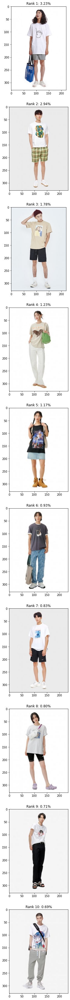

In [58]:
fig, axes = plt.subplots(10, 1, figsize=(10,10))
count = 0
for value, idx in zip(values, indices):
    print(index[idx])
    axes[count].imshow(np.array(Image.open(f'img_files/코디2/{index[idx]}')))
    axes[count].set_title(f"Rank {count + 1}: {100 * value.item():.2f}%")
    count += 1
plt.subplots_adjust(top=5)
plt.show()

In [ ]:
with open(f'data_files/image_features/coat_propro(tuning)/index.pickle', 'rb') as fr:
        index = pickle.load(fr)

In [19]:
len(index)

204